In [3]:
import datetime
import matplotlib.pyplot as plt
import numpy as np
import os
import sys

import postprocessing_util
import postprocessing_plot_util
import simulation_config_utils

module_path = os.path.abspath(os.path.join('..', 'utils'))
if module_path not in sys.path:
    sys.path.append(module_path)

import aimsun_config_utils
import aimsun_folder_utils
import aimsun_input_utils
import metadata_settings

In [4]:
# Get time intervals of study.
TIME_INTERVALS = metadata_settings.get_time_intervals()
TIME_INTERVALS_STRING = [str(time)[:-3] for time in TIME_INTERVALS]

In [5]:
# Loading the macrosimulation config. It is assumed that the simulation has been run inside Aimsun.
# We get the simulation data in the database associated to the simulation in the config.
uncoordinated_simulation_database_path = 'C:\\Users\\prest\\Preston\\Berkeley\\fremont_project\preston_220905\\network_uncoordinated.sqlite'
uncoordinated_simulation_results_database = postprocessing_util.AimsunMicroOutputDatabase(uncoordinated_simulation_database_path)

calibrated_simulation_database_path = 'C:\\Users\\prest\\Preston\\Berkeley\\fremont_project\preston_220905\\network_calibrated.sqlite'
calibrated_simulation_results_database = postprocessing_util.AimsunMicroOutputDatabase(calibrated_simulation_database_path)

In [6]:
# Select metric to compute.
# Here it is an example of delay time.
metric_name, metric_units = 'average delay time', 's'
uncoordinated_simulated_metric_values = postprocessing_plot_util.process_network_delay_time_data(
    uncoordinated_simulation_results_database, TIME_INTERVALS)

calibrated_simulated_metric_values = postprocessing_plot_util.process_network_delay_time_data(
    calibrated_simulation_results_database, TIME_INTERVALS)

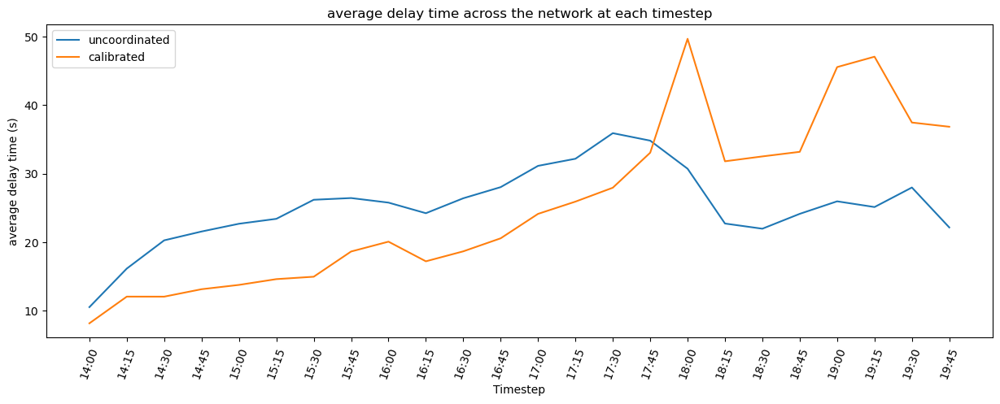

In [7]:
# from matplotlib import rc
# rc('font', **{'family': 'sans-serif', 'sans-serif': ['Computer Modern Sans Serif'], 'size': 20})
# rc('text', usetex=True)

fig = plt.figure(figsize=(15, 5))
plt.title(f"{metric_name} across the network at each timestep")
plt.xlabel("Timestep")
plt.ylabel(f"{metric_name} ({metric_units})")
plt.plot(TIME_INTERVALS_STRING, uncoordinated_simulated_metric_values, label='uncoordinated')
plt.plot(TIME_INTERVALS_STRING, calibrated_simulated_metric_values, label='calibrated')
plt.legend(loc="upper left")
plt.xticks(rotation=70)
plt.show()

# System Data

In [8]:
import pandas as pd

uncoordinated_con = uncoordinated_simulation_results_database.database
uncoordinated_sys_query = pd.read_sql('SELECT * FROM MISYS', uncoordinated_con)
uncoordinated_sys_df = pd.DataFrame(uncoordinated_sys_query)

uncoordinated_sys_df.head()

,did,oid,eid,sid,ent,density,density_D,flow,flow_D,input_flow,...,stime,stime_D,nstops,nstops_D,totalNStops,totalNStops_D,fuelc,fuelc_D,batteryc,batteryc_D
0,151642198,151642198,None,0,1,1.761359,-1.0,8440.0,-1.0,14052.0,...,5.797138,13.853809,0.0,-1.0,1748.0,-1.0,0.0,-1.0,0.0,-1.0
1,151642198,151642198,None,1,1,0.495877,-1.0,2196.0,-1.0,3848.0,...,18.485671,21.170920,0.0,-1.0,1325.0,-1.0,0.0,-1.0,0.0,-1.0
2,151642198,151642198,None,2,1,1.265483,-1.0,6244.0,-1.0,10204.0,...,1.334611,5.043652,0.0,-1.0,423.0,-1.0,0.0,-1.0,0.0,-1.0
3,151642198,151642198,None,0,2,2.734878,-1.0,13840.0,-1.0,15464.0,...,8.975247,16.951414,0.0,-1.0,5740.0,-1.0,0.0,-1.0,0.0,-1.0
4,151642198,151642198,None,1,2,0.795732,-1.0,3932.0,-1.0,4380.0,...,21.443692,23.666571,0.0,-1.0,3170.0,-1.0,0.0,-1.0,0.0,-1.0


In [9]:
calibrated_con = calibrated_simulation_results_database.database
calibrated_sys_query = pd.read_sql('SELECT * FROM MISYS', calibrated_con)
calibrated_sys_df = pd.DataFrame(calibrated_sys_query)

calibrated_sys_df.head()

,did,oid,eid,sid,ent,density,density_D,flow,flow_D,input_flow,...,stime,stime_D,nstops,nstops_D,totalNStops,totalNStops_D,fuelc,fuelc_D,batteryc,batteryc_D
0,151642198,151642198,None,0,1,1.693082,-1.0,8760.0,-1.0,14052.0,...,3.698887,10.111692,0.0,-1.0,1654.0,-1.0,0.0,-1.0,0.0,-1.0
1,151642198,151642198,None,1,1,0.433417,-1.0,2480.0,-1.0,3848.0,...,9.809884,16.023965,0.0,-1.0,1214.0,-1.0,0.0,-1.0,0.0,-1.0
2,151642198,151642198,None,2,1,1.259665,-1.0,6280.0,-1.0,10204.0,...,1.285627,4.556932,0.0,-1.0,440.0,-1.0,0.0,-1.0,0.0,-1.0
3,151642198,151642198,None,0,2,2.497132,-1.0,14580.0,-1.0,15464.0,...,5.643160,9.710035,0.0,-1.0,5239.0,-1.0,0.0,-1.0,0.0,-1.0
4,151642198,151642198,None,1,2,0.668329,-1.0,4092.0,-1.0,4380.0,...,11.871201,12.977442,0.0,-1.0,2689.0,-1.0,0.0,-1.0,0.0,-1.0


In [10]:
class Column:
    def __init__(self, name, desc, unit):
        self.name = name
        self.desc = desc
        self.unit = unit

    def __repr__(self) -> str:
        return f'Column({str(self.name)}, {str(self.desc)}, {str(self.unit)})'

In [11]:
sys_columns = {
    'sid': Column('sid', 'Vehicle type', None),
    'ent': Column('ent', 'Time interval', None),
    'density': Column('density', 'Density', 'veh/km'),
    'flow': Column('flow', 'Mean flow', 'veh/h'),
    'ttime': Column('ttime', 'Mean travel time', 's/km'),
    'dtime': Column('dtime', 'Mean delay time', 's/km'),
    'speed': Column('speed', 'Mean speed', 'km/h'),
    'qmean': Column('qmean', 'Mean vehicles in queue', 'veh'),
    'fuelc': Column('fuelc', 'Total fuel consumed', 'L'),                    # not displayed yet; pending sim run
    'batteryc': Column('batteryc', 'Total battery consumed', 'kWh')          # likewise
}

sys_column_names = sys_columns.keys()
group_columns = ['sid', 'ent']

uncoordinated_sys_df = uncoordinated_sys_df[sys_column_names]
calibrated_sys_df = calibrated_sys_df[sys_column_names]

sys_df = uncoordinated_sys_df.merge(calibrated_sys_df, on=group_columns, suffixes=['_uncoordinated', '_calibrated'])
sys_df = sys_df[(sys_df['sid']==0) & (sys_df['ent']!=0)].drop('sid', axis=1)
sys_df

,ent,density_uncoordinated,flow_uncoordinated,ttime_uncoordinated,dtime_uncoordinated,speed_uncoordinated,qmean_uncoordinated,fuelc_uncoordinated,batteryc_uncoordinated,density_calibrated,flow_calibrated,ttime_calibrated,dtime_calibrated,speed_calibrated,qmean_calibrated,fuelc_calibrated,batteryc_calibrated
0,1,1.761359,8440.0,50.096176,10.546274,80.880735,95.280889,0.0,0.0,1.693082,8760.0,47.804989,8.187263,82.034641,61.329778,0.0,0.0
3,2,2.734878,13840.0,56.672180,16.166451,73.527277,262.134222,0.0,0.0,2.497132,14580.0,52.623929,12.078871,75.524855,126.564444,0.0,0.0
6,3,2.998710,14896.0,60.903016,20.282287,70.819805,353.136889,0.0,0.0,2.516465,15048.0,52.508182,12.073094,75.725359,132.271111,0.0,0.0
9,4,3.283599,15280.0,62.791031,21.570878,69.524337,425.574222,0.0,0.0,2.684697,15572.0,54.073114,13.158075,74.139911,164.224889,0.0,0.0
12,5,3.323521,15348.0,64.293321,22.700916,68.852711,441.211556,0.0,0.0,2.668571,15392.0,54.902333,13.785544,73.818979,177.252444,0.0,0.0
15,6,3.578332,16212.0,65.464581,23.419646,67.822963,490.344000,0.0,0.0,2.851818,16504.0,56.118657,14.627753,72.598204,186.642667,0.0,0.0
18,7,3.671238,15784.0,68.438373,26.198510,65.768645,524.604444,0.0,0.0,2.907366,15604.0,56.615134,14.979349,71.822943,220.020444,0.0,0.0
21,8,3.904245,16728.0,69.034079,26.449397,63.684530,526.380444,0.0,0.0,3.214460,16596.0,60.659380,18.655416,67.944723,293.783111,0.0,0.0
24,9,3.578512,16304.0,68.296675,25.783571,63.686496,447.694222,0.0,0.0,3.065151,15924.0,61.721648,20.091513,67.089618,265.257778,0.0,0.0
27,10,3.625641,15272.0,66.581688,24.239680,65.551838,473.907556,0.0,0.0,3.039545,16004.0,58.960828,17.226667,69.465972,249.379556,0.0,0.0


In [13]:
sys_columns = np.reshape(list(sys_columns.values())[2:], (4, 2))
sys_columns

array([[Column(density, Density, veh/km), Column(flow, Mean flow, veh/h)],
       [Column(ttime, Mean travel time, s/km),
        Column(dtime, Mean delay time, s/km)],
       [Column(speed, Mean speed, km/h),
        Column(qmean, Mean vehicles in queue, veh)],
       [Column(fuelc, Total fuel consumed, L),
        Column(batteryc, Total battery consumed, kWh)]], dtype=object)

[[Column(density, Density, veh/km) Column(flow, Mean flow, veh/h)]
 [Column(ttime, Mean travel time, s/km)
  Column(dtime, Mean delay time, s/km)]
 [Column(speed, Mean speed, km/h)
  Column(qmean, Mean vehicles in queue, veh)]
 [Column(fuelc, Total fuel consumed, L)
  Column(batteryc, Total battery consumed, kWh)]]


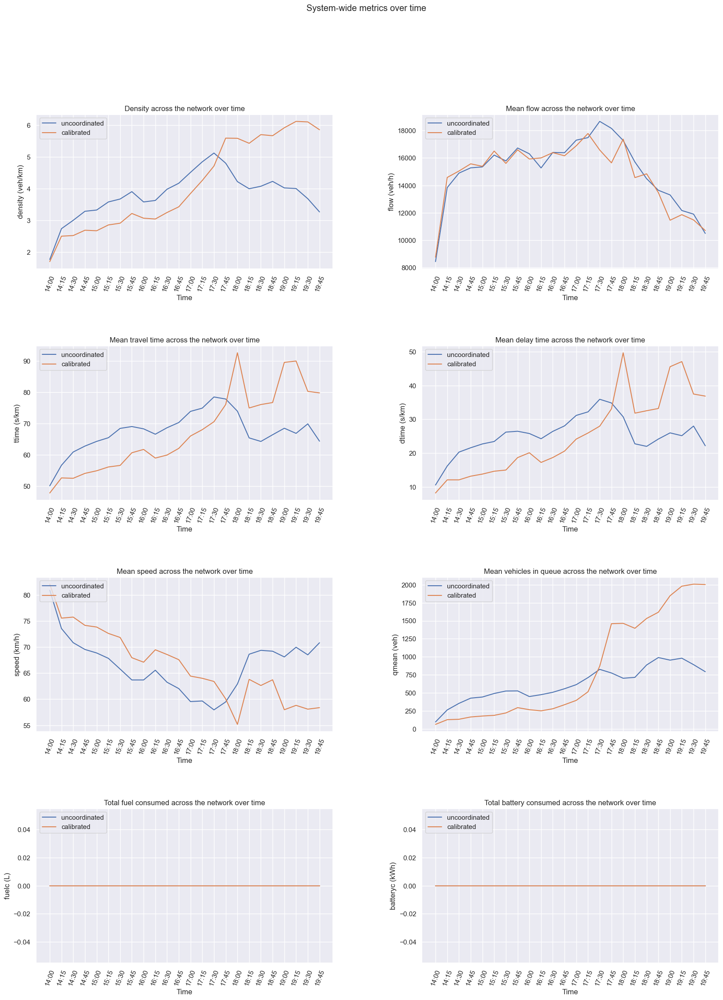

In [14]:
import seaborn as sns
sns.set_theme()

fig, axs = plt.subplots(4, 2, figsize=(20, 25))
fig.suptitle('System-wide metrics over time')
print(sys_columns)
for i in range(4):
    for j in range(2):
        ax, metric = axs[i][j], sys_columns[i][j]
        ax.plot(TIME_INTERVALS_STRING, sys_df[f'{metric.name}_uncoordinated'], label='uncoordinated')
        ax.plot(TIME_INTERVALS_STRING, sys_df[f'{metric.name}_calibrated'], label='calibrated')
        ax.set_title(f'{metric.desc} across the network over time')
        ax.set_xlabel('Time')
        ax.set_ylabel(f'{metric.name} ({metric.unit})')
        ax.legend(loc="upper left")
        ax.tick_params('x', labelrotation=70) 

plt.subplots_adjust(wspace=0.3, hspace=0.5)
plt.show()

<a id='specific-location-validation'></a>
# Section Data

In [15]:
import pandas as pd

uncoordinated_con = uncoordinated_simulation_results_database.database
uncoordinated_section_query = pd.read_sql('SELECT * FROM MISECT', uncoordinated_con)
uncoordinated_section_df = pd.DataFrame(uncoordinated_section_query)

uncoordinated_section_df.head()

,did,oid,eid,sid,ent,flow,flow_D,count,count_D,input_flow,...,total_lane_changes,total_lane_changes_D,stime,stime_D,nstops,nstops_D,fuelc,fuelc_D,batteryc,batteryc_D
0,151642198,242,242,0,1,1376.0,-1.0,344.0,-1.0,1388.0,...,0.0,-1.0,0.14186,1.154377,0.017442,-1.0,0.0,-1.0,0.0,-1.0
1,151642198,243,243,0,1,1308.0,-1.0,327.0,-1.0,1316.0,...,5.0,-1.0,0.00000,0.000000,0.000000,-1.0,0.0,-1.0,0.0,-1.0
2,151642198,244,244,0,1,1332.0,-1.0,333.0,-1.0,1336.0,...,6.0,-1.0,0.00000,0.000000,0.000000,-1.0,0.0,-1.0,0.0,-1.0
3,151642198,246,246,0,1,0.0,-1.0,0.0,-1.0,0.0,...,0.0,-1.0,-1.00000,-1.000000,-1.000000,-1.0,-1.0,-1.0,-1.0,-1.0
4,151642198,247,247,0,1,8.0,-1.0,2.0,-1.0,8.0,...,0.0,-1.0,0.00000,0.000000,0.000000,-1.0,0.0,-1.0,0.0,-1.0


In [16]:
calibrated_con = calibrated_simulation_results_database.database
calibrated_section_query = pd.read_sql('SELECT * FROM MISECT', calibrated_con)
calibrated_section_df = pd.DataFrame(calibrated_section_query)

calibrated_section_df.head()

,did,oid,eid,sid,ent,flow,flow_D,count,count_D,input_flow,...,total_lane_changes,total_lane_changes_D,stime,stime_D,nstops,nstops_D,fuelc,fuelc_D,batteryc,batteryc_D
0,151642198,242,242,0,1,1356.0,-1.0,339.0,-1.0,1372.0,...,0.0,-1.0,0.0,0.0,0.0,-1.0,0.0,-1.0,0.0,-1.0
1,151642198,243,243,0,1,1256.0,-1.0,314.0,-1.0,1268.0,...,4.0,-1.0,0.0,0.0,0.0,-1.0,0.0,-1.0,0.0,-1.0
2,151642198,244,244,0,1,1280.0,-1.0,320.0,-1.0,1284.0,...,4.0,-1.0,0.0,0.0,0.0,-1.0,0.0,-1.0,0.0,-1.0
3,151642198,246,246,0,1,0.0,-1.0,0.0,-1.0,0.0,...,0.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0
4,151642198,247,247,0,1,8.0,-1.0,2.0,-1.0,8.0,...,0.0,-1.0,0.0,0.0,0.0,-1.0,0.0,-1.0,0.0,-1.0


In [17]:
dfs_section = {'uncoordinated': uncoordinated_section_df, 'calibrated': calibrated_section_df}
null_values = {'eid': None, 'ent': None, 'flow': 0, 'ttime': -1, 'dtime': -1, 'speed': -1, 'density': 0}  # 'qmean': None, 
group_cols = ['ent', 'eid']

def preprocess_sections(df):
    df = df.filter(items=null_values.keys()).dropna(axis=0)
    for k, v in null_values.items():
        df = df[df[k]!=v]
    return df.groupby(group_cols).mean()

In [18]:
for k in dfs_section:
    dfs_section[k] = preprocess_sections(dfs_section[k])

dfs_section['uncoordinated']

flow      ttime     dtime      speed   density
ent eid                                                      
0   1006   7.444444  12.763566  0.743011  43.098619  0.173434
    1007   1.666667   9.521830  0.464328  42.285374  0.039649
    1008   7.555556  13.515842  1.060115  42.241177  0.182118
    1009   5.777778   9.316341  0.744148  42.449772  0.136320
    1016   0.333333  19.310881  5.372306  29.262586  0.011428
...             ...        ...       ...        ...       ...
24  990   24.000000   3.605744  0.188269  42.220480  0.534835
    991    8.000000   2.092352  0.000000  44.407126  0.180632
    992    8.000000   1.683269  0.000000  44.407113  0.180632
    993    8.000000   2.326868  0.000000  44.406982  0.135871
    997    8.000000   3.955889  0.000000  42.930384  0.186646

[70485 rows x 5 columns]

In [19]:
dfs_section['calibrated']

flow      ttime     dtime      speed   density
ent eid                                                      
0   1006   5.000000  12.585659  0.789904  43.651691  0.114981
    1007   0.888889   9.253191  0.449246  43.428671  0.020546
    1008   5.111111  13.236698  1.046565  43.062542  0.119234
    1009   4.000000   9.170769  0.728741  43.094756  0.093181
    1019   0.333333  15.437839  0.927795  36.545346  0.012345
...             ...        ...       ...        ...       ...
24  990   85.333333   3.567880  0.055352  42.742339  2.005427
    991   82.666667   2.300768  0.151965  41.211224  2.056958
    992   74.666667   1.745433  0.014634  42.962896  1.748162
    993   74.666667   2.453261  0.060699  42.380432  1.777483
    997    4.000000   3.797869  0.000000  44.645255  0.089595

[67103 rows x 5 columns]

In [20]:
section_df = dfs_section['uncoordinated'].join(dfs_section['calibrated'], 
    on=group_cols, lsuffix='_uncoordinated', rsuffix='_calibrated').dropna()

section_df

flow_uncoordinated  ttime_uncoordinated  dtime_uncoordinated  \
ent eid                                                                  
0   1006            7.444444            12.763566             0.743011   
    1007            1.666667             9.521830             0.464328   
    1008            7.555556            13.515842             1.060115   
    1009            5.777778             9.316341             0.744148   
    1019            0.833333            14.086820             1.121246   
...                      ...                  ...                  ...   
24  990            24.000000             3.605744             0.188269   
    991             8.000000             2.092352             0.000000   
    992             8.000000             1.683269             0.000000   
    993             8.000000             2.326868             0.000000   
    997             8.000000             3.955889             0.000000   

          speed_uncoordinated  density_uncoordinated  flow_calibrated  \
ent eid                                                                 
0   1006            43.098619               0.173434         5.000000   
    1007            42.285374               0.039649         0.888889   
    1008            42.241177               0.182118         5.111111   
    1009            42.449772               0.136320         4.000000   
    1019            40.069264               0.020920         0.333333   
...                       ...                    ...              ...   
24  990             42.220480               0.534835        85.333333   
    991             44.407126               0.180632        82.666667   
    992             44.407113               0.180632        74.666667   
    993             44.406982               0.135871        74.666667   
    997             42.930384               0.186646         4.000000   

          ttime_calibrated  dtime_calibrated  speed_calibrated  \
ent eid                                                          
0   1006         12.585659          0.789904         43.651691   
    1007          9.253191          0.449246         43.428671   
    1008         13.236698          1.046565         43.062542   
    1009          9.170769          0.728741         43.094756   
    1019         15.437839          0.927795         36.545346   
...                    ...               ...               ...   
24  990           3.567880          0.055352         42.742339   
    991           2.300768          0.151965         41.211224   
    992           1.745433          0.014634         42.962896   
    993           2.453261          0.060699         42.380432   
    997           3.797869          0.000000         44.645255   

          density_calibrated  
ent eid                       
0   1006            0.114981  
    1007            0.020546  
    1008            0.119234  
    1009            0.093181  
    1019            0.012345  
...                      ...  
24  990             2.005427  
    991             2.056958  
    992             1.748162  
    993             1.777483  
    997             0.089595  

[62811 rows x 10 columns]

In [21]:
import geopandas as gpd

sections = gpd.read_file('C:/Users/prest/Dropbox/Fremont project/Data collection copy/Data/Manually made/Network/Map/Aimsun/sections.shp')
sections.crs

<Projected CRS: EPSG:32610>
Name: WGS 84 / UTM zone 10N
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: World - N hemisphere - 126°W to 120°W - by country
- bounds: (-126.0, 0.0, -120.0, 84.0)
Coordinate Operation:
- name: UTM zone 10N
- method: Transverse Mercator
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [22]:
sections.head()

,id,eid,name,nb_lanes,speed,capacity,rd_type,func_class,fnode,tnode,geometry
0,242.0,242,None,1,104.0,2100.0,175.0,1,9845.0,9923.0,"LINESTRING (595252.181 4150435.052, 595253.901..."
1,243.0,243,None,4,104.0,8400.0,175.0,1,151597118.0,9848.0,"LINESTRING (595265.608 4150280.074, 595317.667..."
2,244.0,244,None,4,104.0,8400.0,175.0,1,9850.0,9852.0,"LINESTRING (595157.244 4150398.388, 595192.299..."
3,246.0,246,Geyser Court,1,40.0,600.0,179.0,5,9868.0,NaN,"LINESTRING (595944.356 4151399.245, 595918.857..."
4,247.0,247,Geyser Court,1,40.0,600.0,179.0,5,NaN,9868.0,"LINESTRING (595835.421 4151361.321, 595846.572..."


In [23]:
section_cols = {
    'flow': Column('flow', 'Mean flow', 'veh/h'),
    'ttime': Column('ttime', 'Mean travel time', 's'),
    'dtime': Column('dtime', 'Mean delay time', 's'),
    'speed': Column('speed', 'Mean speed', 'km/h'),
    'density': Column('density', 'Density by lane', 'veh/km')
}

In [24]:
section_df = section_df.groupby('eid').mean()
section_df

,flow_uncoordinated,ttime_uncoordinated,dtime_uncoordinated,speed_uncoordinated,density_uncoordinated,flow_calibrated,ttime_calibrated,dtime_calibrated,speed_calibrated,density_calibrated
eid,,,,,,,,,,
1006,10.084967,12.781622,0.774778,43.078928,0.234387,8.529412,12.474872,0.803892,44.001242,0.194911
1007,4.333333,9.806458,0.479489,41.138671,0.105967,3.644444,9.074135,0.470062,44.342686,0.082854
1008,10.388889,13.466490,1.058058,42.399617,0.247733,6.819444,13.078190,1.065225,43.539430,0.158179
1009,8.829630,9.383114,0.716575,42.184193,0.206936,5.600000,9.084914,0.742426,43.453791,0.129719
1017,4.000000,24.158951,0.000000,48.603683,0.082298,4.000000,28.324766,0.000000,41.455383,0.096489
...,...,...,...,...,...,...,...,...,...,...
992,45.200000,1.806607,0.091981,41.802410,1.101787,44.715556,1.770241,0.074143,42.556253,1.065812
993,45.200000,2.459999,0.091105,42.251454,1.085162,44.715556,2.463111,0.119744,42.198589,1.072123
994,2.333333,2.949151,0.521877,35.486994,0.066007,2.583333,2.984889,0.591632,35.241137,0.075994


In [25]:
for col in section_cols:
    section_df[f'{col}_ratio'] = section_df[f'{col}_calibrated'] / section_df[f'{col}_uncoordinated']

section_df

,flow_uncoordinated,ttime_uncoordinated,dtime_uncoordinated,speed_uncoordinated,density_uncoordinated,flow_calibrated,ttime_calibrated,dtime_calibrated,speed_calibrated,density_calibrated,flow_ratio,ttime_ratio,dtime_ratio,speed_ratio,density_ratio
eid,,,,,,,,,,,,,,,
1006,10.084967,12.781622,0.774778,43.078928,0.234387,8.529412,12.474872,0.803892,44.001242,0.194911,0.845755,0.976001,1.037577,1.021410,0.831581
1007,4.333333,9.806458,0.479489,41.138671,0.105967,3.644444,9.074135,0.470062,44.342686,0.082854,0.841026,0.925322,0.980340,1.077883,0.781891
1008,10.388889,13.466490,1.058058,42.399617,0.247733,6.819444,13.078190,1.065225,43.539430,0.158179,0.656417,0.971165,1.006773,1.026883,0.638507
1009,8.829630,9.383114,0.716575,42.184193,0.206936,5.600000,9.084914,0.742426,43.453791,0.129719,0.634228,0.968220,1.036075,1.030097,0.626855
1017,4.000000,24.158951,0.000000,48.603683,0.082298,4.000000,28.324766,0.000000,41.455383,0.096489,1.000000,1.172434,NaN,0.852927,1.172434
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
992,45.200000,1.806607,0.091981,41.802410,1.101787,44.715556,1.770241,0.074143,42.556253,1.065812,0.989282,0.979871,0.806074,1.018033,0.967349
993,45.200000,2.459999,0.091105,42.251454,1.085162,44.715556,2.463111,0.119744,42.198589,1.072123,0.989282,1.001265,1.314356,0.998749,0.987984
994,2.333333,2.949151,0.521877,35.486994,0.066007,2.583333,2.984889,0.591632,35.241137,0.075994,1.107143,1.012118,1.133663,0.993072,1.151305


### Note: All plots are aggregated over all timesteps. At some point I'll make plots for each timestep.

In [26]:
section_df = section_df.merge(sections[['eid', 'geometry']], left_index=True, right_on='eid').set_index('eid')
section_df = gpd.GeoDataFrame(section_df, geometry='geometry')
frame = section_df.to_crs("EPSG:3857")
frame

,flow_uncoordinated,ttime_uncoordinated,dtime_uncoordinated,speed_uncoordinated,density_uncoordinated,flow_calibrated,ttime_calibrated,dtime_calibrated,speed_calibrated,density_calibrated,flow_ratio,ttime_ratio,dtime_ratio,speed_ratio,density_ratio,geometry
eid,,,,,,,,,,,,,,,,
1006,10.084967,12.781622,0.774778,43.078928,0.234387,8.529412,12.474872,0.803892,44.001242,0.194911,0.845755,0.976001,1.037577,1.021410,0.831581,"LINESTRING (-13572729.375 4511855.337, -135727..."
1007,4.333333,9.806458,0.479489,41.138671,0.105967,3.644444,9.074135,0.470062,44.342686,0.082854,0.841026,0.925322,0.980340,1.077883,0.781891,"LINESTRING (-13572788.740 4511703.374, -135728..."
1008,10.388889,13.466490,1.058058,42.399617,0.247733,6.819444,13.078190,1.065225,43.539430,0.158179,0.656417,0.971165,1.006773,1.026883,0.638507,"LINESTRING (-13572773.768 4511698.341, -135727..."
1009,8.829630,9.383114,0.716575,42.184193,0.206936,5.600000,9.084914,0.742426,43.453791,0.129719,0.634228,0.968220,1.036075,1.030097,0.626855,"LINESTRING (-13572921.125 4511676.124, -135728..."
1017,4.000000,24.158951,0.000000,48.603683,0.082298,4.000000,28.324766,0.000000,41.455383,0.096489,1.000000,1.172434,NaN,0.852927,1.172434,"LINESTRING (-13573741.837 4512051.852, -135737..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
990,50.208889,3.590832,0.115746,42.531322,1.196708,53.835556,3.610125,0.130234,42.340220,1.286695,1.072232,1.005373,1.125167,0.995507,1.075196,"LINESTRING (-13573596.964 4515066.055, -135735..."
991,39.582222,2.250570,0.117781,41.960428,0.978511,41.813333,2.340254,0.207628,40.806892,1.051392,1.056366,1.039849,1.762833,0.972509,1.074482,"LINESTRING (-13573624.595 4515027.159, -135736..."
992,45.200000,1.806607,0.091981,41.802410,1.101787,44.715556,1.770241,0.074143,42.556253,1.065812,0.989282,0.979871,0.806074,1.018033,0.967349,"LINESTRING (-13573648.312 4514993.336, -135736..."


In [27]:
frame['log_flow_uncoordinated'] = np.log(frame['flow_uncoordinated'])
frame['log_flow_calibrated'] = np.log(frame['flow_calibrated'])

log_flow = Column('log_flow', 'Logarithm of mean flow', 'veh/h')

In [28]:
frame['log_flow_uncoordinated'].head()

eid
1006    2.311046
1007    1.466337
1008    2.340737
1009    2.178113
1017    1.386294
Name: log_flow_uncoordinated, dtype: float64

In [29]:
frame['log_flow_calibrated'].head()

eid
1006    2.143520
1007    1.293204
1008    1.919778
1009    1.722767
1017    1.386294
Name: log_flow_calibrated, dtype: float64

# Map of affected nodes

In [30]:
import geopandas as gpd

sections = gpd.read_file('C:/Users/prest/Dropbox/Fremont project/Data collection copy/Data/Manually made/Network/Map/Aimsun/sections.shp')
nodes = gpd.read_file('C:/Users/prest/Dropbox/Fremont project/Data collection copy/Data/Manually made/Network/Map/Aimsun/nodes.shp')
sections, nodes = sections.to_crs("EPSG:3857"), nodes.to_crs("EPSG:3857")

sections.head()

,id,eid,name,nb_lanes,speed,capacity,rd_type,func_class,fnode,tnode,geometry
0,242.0,242,None,1,104.0,2100.0,175.0,1,9845.0,9923.0,"LINESTRING (-13572344.019 4508460.315, -135723..."
1,243.0,243,None,4,104.0,8400.0,175.0,1,151597118.0,9848.0,"LINESTRING (-13572329.348 4508264.159, -135722..."
2,244.0,244,None,4,104.0,8400.0,175.0,1,9850.0,9852.0,"LINESTRING (-13572464.084 4508415.329, -135724..."
3,246.0,246,Geyser Court,1,40.0,600.0,179.0,5,9868.0,NaN,"LINESTRING (-13571458.486 4509669.510, -135714..."
4,247.0,247,Geyser Court,1,40.0,600.0,179.0,5,NaN,9868.0,"LINESTRING (-13571596.214 4509623.139, -135715..."


In [31]:
nodes.head()

,id,eid,name,nodetype,geometry
0,9845.0,9845,None,0.0,POINT (-13572349.670 4508461.025)
1,9848.0,9848,None,0.0,POINT (-13572263.070 4508190.059)
2,9850.0,9850,None,0.0,POINT (-13572465.454 4508416.802)
3,9852.0,9852,None,0.0,POINT (-13572419.374 4508365.715)
4,9854.0,9854,None,0.0,POINT (-13573710.462 4509848.237)


In [32]:
signalized_nodes = {
    'city-controlled': {
        '27399': ['Washington Boulevard', 'Paseo Padre Parkway'],
        '27553': ['Paseo Parde Parkway', 'Durham Road'],
        '13225': ['Mission Boulevard', 'Washington Boulevard'],
        '27847': ['Mission Boulevard', 'Anza Street'],
        '27869': ['Mission Boulevard', 'Pine Lane'],
        '27889': ['Mission Boulevard', 'Hunter Lane'],
        '27921': ['Mission Boulevard', 'Cougar Drive'],
        '27938': ['Mission Boulevard', 'South Grimmer Boulevard'],
        '27954': ['Mission Boulevard', 'Stanford Ave'],
        '16827': ['Mission Boulevard', 'Paseo Parde Parkway'],
        '56391': ['Washington Boulevard', 'Osgood Road - Driscoll Road'],
        '56129': ['Washington Boulevard', 'Meredith Drive'],
        '56324': ['Paseo Padre Parkway', 'Gomes Road'],
        '56297': ['Paseo Padre Parkway', 'Driscoll Road'],
        '56270': ['Paseo Padre Parkway', 'Chadbourne Drive'],
        '62356': ['Osgood Road', 'Blacow Road'],
        '56418': ['Auto Mall Parkway', 'Osgood Road'],
        '56471': ['Warm Springs Boulevard - Osgood Road', 'S. Grimmer'],
        '45371': ['Warm Springs Boulevard', 'Mission Ct'],
        '56438': ['Warm Springs Boulevard', 'East Warren Avenue'],
        '62346': ['Osgood Road', 'Walmart Driveway'],
        '53579': ['Warm Springs Boulevard', 'Fulton Place'],
        '38460': ['Warm Springs Boulevard', 'Warm Springs Bart'],
        '45004': ['Warm Springs Boulevard', 'Transit Way'],
        '56244': ['Driscoll Road', 'Amapola Drive'],
        '56484': ['East Warren Avenue', 'Fernald Street']
    },
    'state-controlled': {
        '42160': ['Mission Boulevard', 'Esparito Avenue - Ondina Drive'],
        '56218': ['Mission Boulevard', 'Driscoll Road'],
        '27479': ['Mission Boulevard', 'Palm Ave'],
        '56451': ['Mission Boulevard', 'Warm Springs Boulevard'],
        '62795': ['Mission Boulevard', 'Mohave Drive'],
        '27796': ['Mission Boulevard', 'I-680 Southbound Ramp'],
        '27816': ['Mission Boulevard', 'I-680 Northbound Ramp - Mission Road'],
        '27327': ['Washington Boulevard', 'I-680 Southbound Ramp'],
        '27345': ['Washington Boulevard', 'I-680 Nouthbound Ramp - Luzon Drive'],
        '56173': ['Durham Road', 'I-680 Southbound Ramp'],
        '27711': ['Durham Road', 'I-680 Northbound Ramp'],
    }
}

In [33]:
node_geo_city = nodes[nodes['eid'].isin(signalized_nodes['city-controlled'].keys())]
node_geo_state = nodes[nodes['eid'].isin(signalized_nodes['state-controlled'].keys())]

In [34]:
# TAZ

taz_int = gpd.read_file('C:\\Users\\prest\\Dropbox\\Fremont project\\Data collection\\Data\\Auxiliary\\Demand\\TAZ_old\\Internal\\Internal_TAZ.shp') 


# TAZs (all)
# /Users/albenbagabaldo/Dropbox/Fremont project/Data collection/Data/Auxiliary/Demand/TAZ_old/TAZ.shp


# internal TAZs
#/Users/albenbagabaldo/Dropbox/Fremont project/Data collection/Data/Auxiliary/Demand/TAZ_old/Internal/Internal_TAZ.shp



In [35]:
taz_int.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [36]:
taz_int = taz_int.to_crs(32610)

taz_int.crs

<Projected CRS: EPSG:32610>
Name: WGS 84 / UTM zone 10N
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: World - N hemisphere - 126°W to 120°W - by country
- bounds: (-126.0, 0.0, -120.0, 84.0)
Coordinate Operation:
- name: UTM zone 10N
- method: Transverse Mercator
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [37]:
taz_int.head()

,label,CentroidID,geometry
0,1,int_1,"POLYGON ((593362.443 4152566.239, 593369.007 4..."
1,2,int_2,"POLYGON ((592867.776 4156289.021, 592885.443 4..."
2,3,int_3,"POLYGON ((595534.710 4154854.561, 595534.799 4..."
3,4,int_4,"POLYGON ((593552.877 4155076.124, 593553.127 4..."
4,5,int_5,"POLYGON ((595114.374 4151432.088, 595114.627 4..."


Text(0.5, 1.0, 'Traffic Analysis Zones')

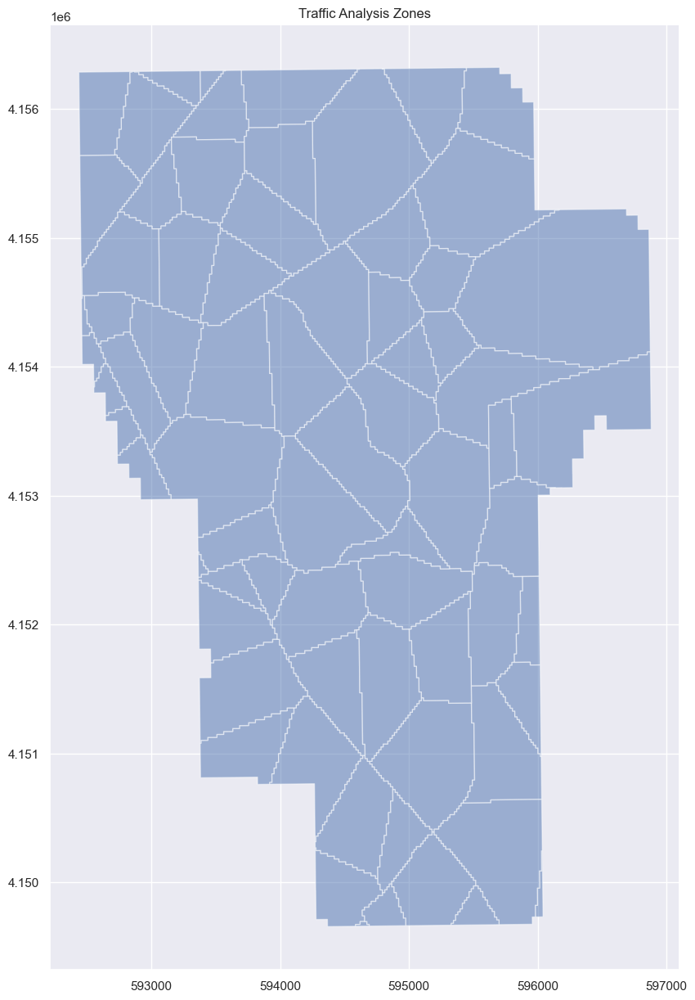

In [38]:
# visualize 

ax = taz_int.plot(figsize=(15, 15), alpha=0.5) #, column='area', legend=True, cmap='OrRd')
# cx.add_basemap(ax, crs='EPSG:32610', source=cx.providers.CartoDB.Voyager) #4326
plt.title('Traffic Analysis Zones')

Text(0.5, 1.0, 'Traffic Analysis Zones')

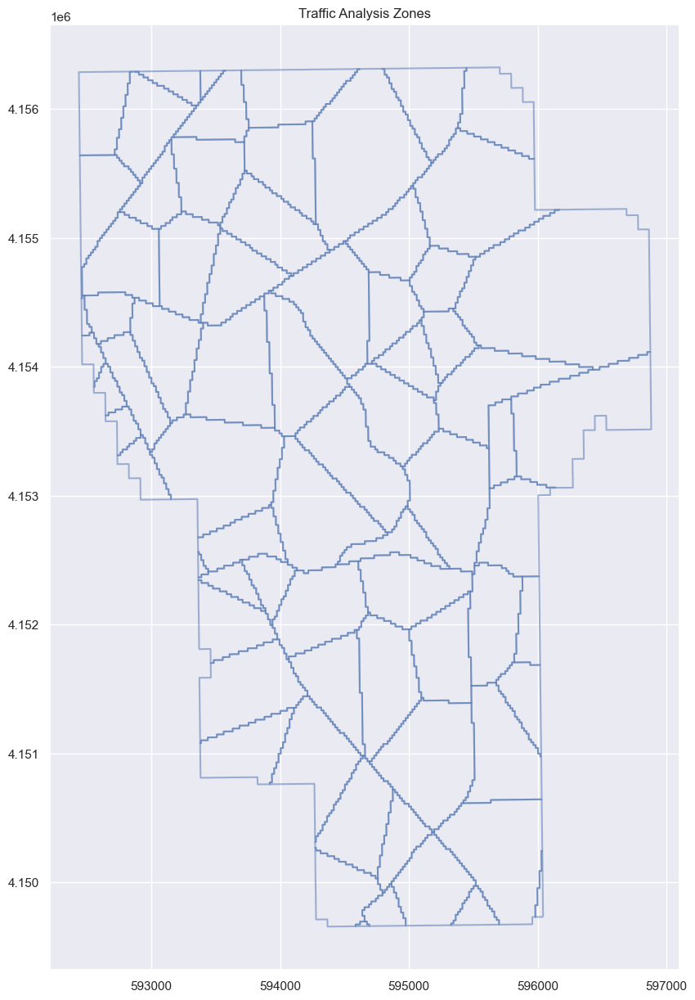

In [39]:
# visualize 

ax = taz_int.boundary.plot(figsize=(15, 15), alpha=0.5) #, column='area', legend=True, cmap='OrRd')
# cx.add_basemap(ax, crs='EPSG:32610', source=cx.providers.CartoDB.Voyager) #4326
plt.title('Traffic Analysis Zones')

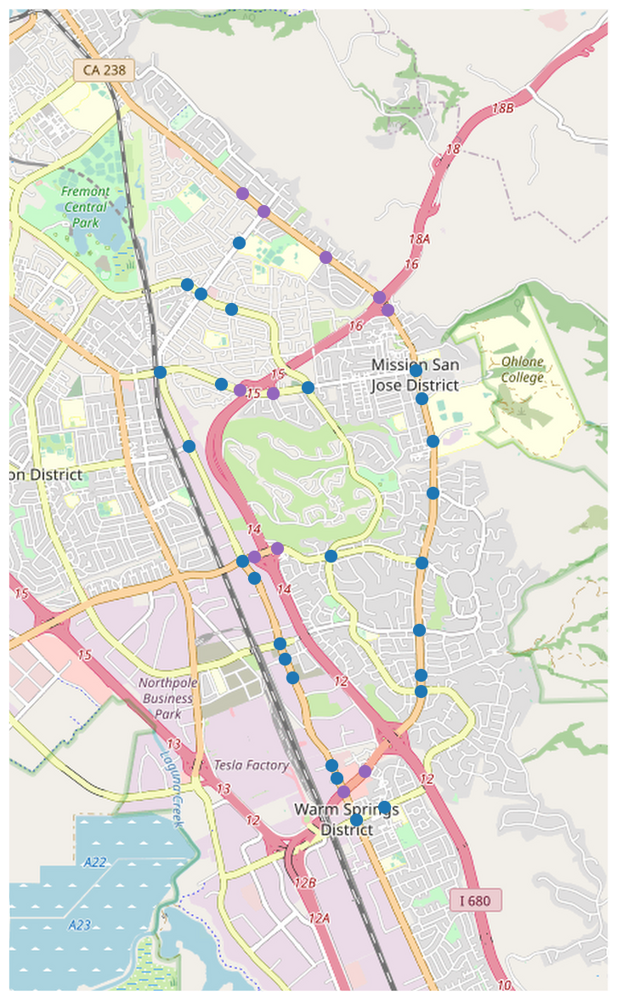

In [40]:
import tilemapbase
tilemapbase.start_logging()
tilemapbase.init(create=True)
extent = tilemapbase.extent_from_frame(frame, buffer=25)

fig, ax = plt.subplots(figsize=(15, 15))
ax.xaxis.set_visible(False)
ax.yaxis.set_visible(False)
plotter = tilemapbase.Plotter(extent, tilemapbase.tiles.build_OSM(), width=400)
plotter.plot(ax)
# frame.plot(ax=ax, column="name", color="0.8")

taz_int.plot(ax=ax, alpha=0.5, zorder=1)
node_geo_city.plot(ax=ax, color='#1F77B4', lw=5)
node_geo_state.plot(ax=ax, color='#9467bd', lw=5)
# ax.legend(frame.name)

# ax = frame.plot('name', color='0.8', figsize=(15, 15))
# nodes.to_crs("EPSG:3857").plot(ax=ax, color='yellow', lw=0.01)
# uncoordinated_node_geo.plot(ax=ax, color='red', lw=3)
# plt.title('Uncoordinated nodes')
# plt.axis('off')
plt.show()

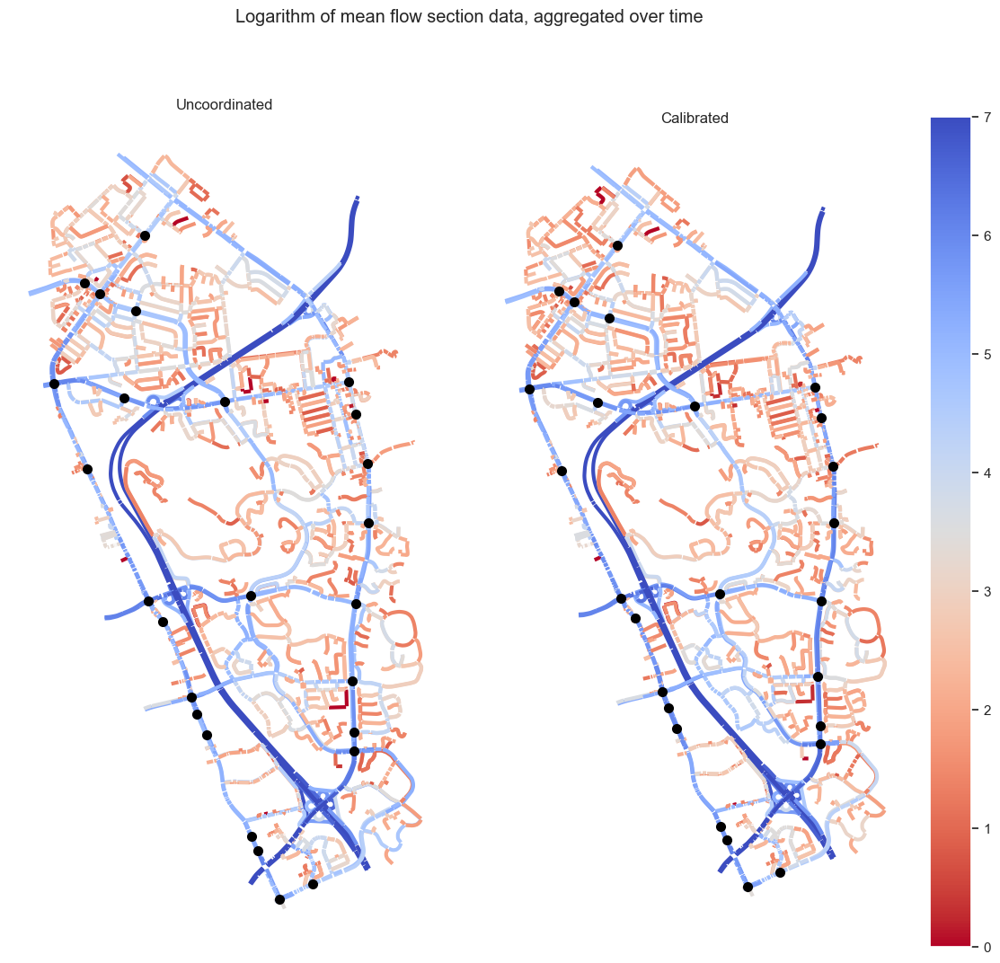

In [41]:
# ax = frame.plot(figsize=(15,15), column=f'{col.name}_ratio', legend=True, cmap='coolwarm_r', lw=3, vmin=0, vmax=2, zorder=0)
# node_geo_city.plot(ax=ax, color='black', lw=2, zorder=1)
# plt.axis('off')
# plt.title(f'Relative (calibrated/uncoordinated) {col.desc} ratio by section, aggregated over time')
# plt.show()

# fig, axs = plt.subplots(1, 5, figsize=(30, 9))

def section_plot(metric, min_val, max_val):
    fig, axs = plt.subplots(1, 2, figsize=(15, 12))
    fig.suptitle(f'{metric.desc} section data, aggregated over time')
    for i in range(2):
        ax, type = axs[i], ['uncoordinated', 'calibrated'][i]
        frame.plot(ax=ax, column=f'{metric.name}_{type}', legend=(i==1), cmap='coolwarm_r', lw=3, vmin=min_val, vmax=max_val, zorder=0)
        node_geo_city.plot(ax=ax, color='black', lw=2, zorder=1)
        ax.set_title(['Uncoordinated', 'Calibrated'][i])
        ax.axis('off')

    plt.subplots_adjust(wspace=0)
    plt.show()

section_plot(log_flow, 0, 7)

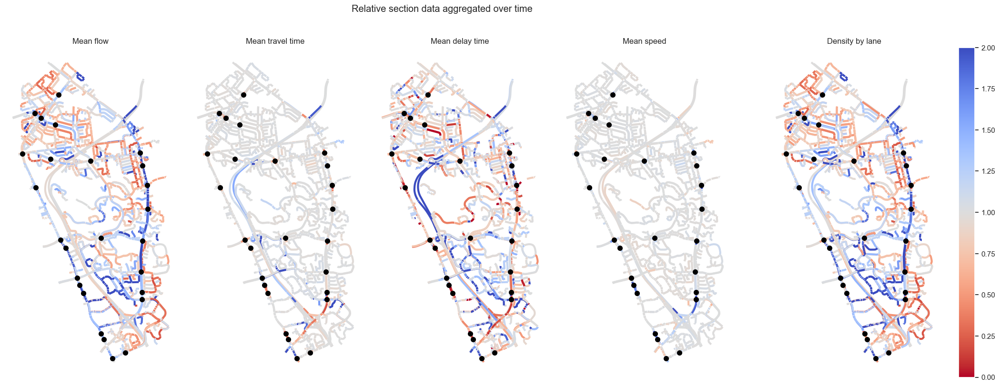

In [42]:
fig, axs = plt.subplots(1, 5, figsize=(30, 9))
fig.suptitle('Relative section data aggregated over time')
for i in range(5):
    ax, metric = axs[i], list(section_cols.values())[i]
    frame.plot(ax=ax, column=f'{metric.name}_ratio', legend=(i==4), cmap='coolwarm_r', lw=3, vmin=0, vmax=2, zorder=0)
    node_geo_city.plot(ax=ax, color='black', lw=2, zorder=1)
    ax.set_title(metric.desc)
    ax.axis('off')

plt.subplots_adjust(wspace=-0.5)
plt.show()

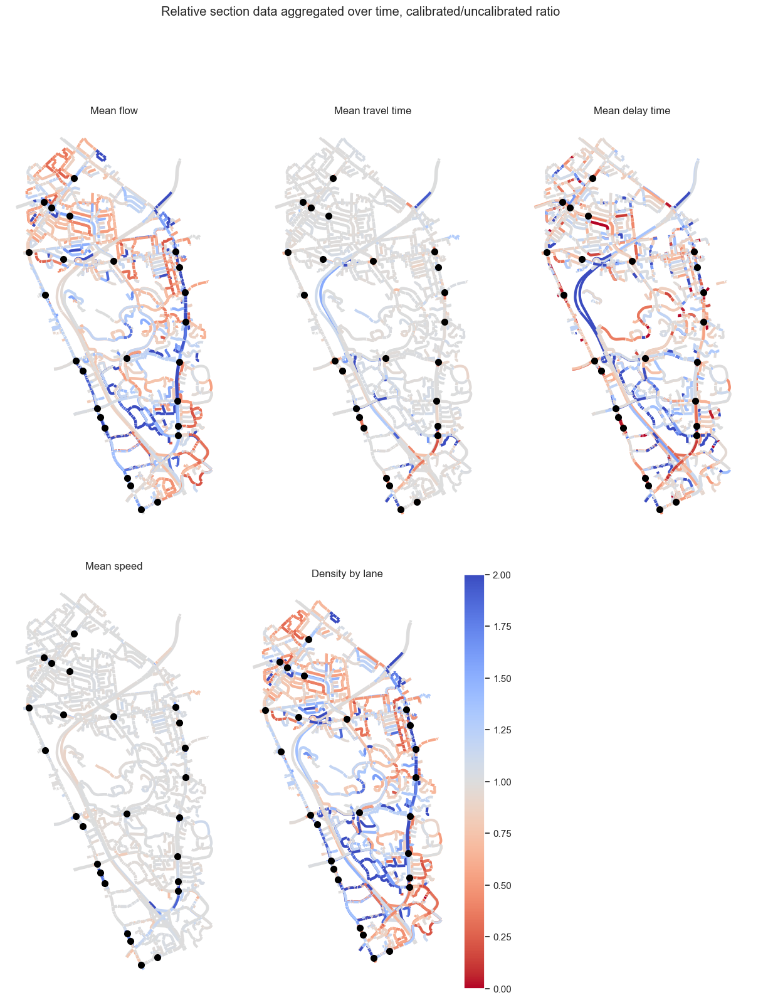

In [43]:
fig, axs = plt.subplots(2, 3, figsize=(16, 18))
fig.suptitle('Relative section data aggregated over time, calibrated/uncalibrated ratio')
for i in range(6):
    ax = axs[i//3][i%3]
    ax.axis('off')
    if i<5:
        metric = list(section_cols.values())[i]
        frame.plot(ax=ax, column=f'{metric.name}_ratio', legend=(i==4), cmap='coolwarm_r', lw=3, vmin=0, vmax=2, zorder=0)
        node_geo_city.plot(ax=ax, color='black', lw=2, zorder=1)
        ax.set_title(metric.desc)

plt.subplots_adjust(wspace=0, hspace=0.1)
plt.show()

# OD Data

In [44]:
uncoordinated_od_query = pd.read_sql('SELECT * FROM MICENT_O', uncoordinated_con)
uncoordinated_od_df = pd.DataFrame(uncoordinated_od_query)

uncoordinated_od_df

,did,oid,eid,sid,ent,destination,nbveh,nbveh_D,flow,flow_D,...,qvmean,qvmean_D,stime,stime_D,nstops,nstops_D,fuelc,fuelc_D,batteryc,batteryc_D
0,151642198,151634377,int_0,0,1,151634377.0,0.0,-1.0,0.0,-1.0,...,0.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0
1,151642198,151634377,int_0,0,1,151634402.0,0.0,-1.0,0.0,-1.0,...,0.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0
2,151642198,151634377,int_0,0,1,151634411.0,0.0,-1.0,0.0,-1.0,...,0.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0
3,151642198,151634377,int_0,0,1,151634430.0,0.0,-1.0,0.0,-1.0,...,0.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0
4,151642198,151634377,int_0,0,1,151634517.0,0.0,-1.0,0.0,-1.0,...,0.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
561145,151642198,151635745,ext_10,2,0,151635736.0,0.0,-1.0,0.0,-1.0,...,0.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0
561146,151642198,151635745,ext_10,2,0,151635739.0,0.0,-1.0,0.0,-1.0,...,0.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0
561147,151642198,151635745,ext_10,2,0,151635742.0,0.0,-1.0,0.0,-1.0,...,0.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0
561148,151642198,151635745,ext_10,2,0,151635745.0,0.0,-1.0,0.0,-1.0,...,0.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0


In [45]:
calibrated_od_query = pd.read_sql('SELECT * FROM MICENT_O', calibrated_con)
calibrated_od_df = pd.DataFrame(calibrated_od_query)

calibrated_od_df

,did,oid,eid,sid,ent,destination,nbveh,nbveh_D,flow,flow_D,...,qvmean,qvmean_D,stime,stime_D,nstops,nstops_D,fuelc,fuelc_D,batteryc,batteryc_D
0,151642198,151634377,int_0,0,1,151634377.0,0.0,-1.0,0.0,-1.0,...,0.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0
1,151642198,151634377,int_0,0,1,151634402.0,0.0,-1.0,0.0,-1.0,...,0.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0
2,151642198,151634377,int_0,0,1,151634411.0,0.0,-1.0,0.0,-1.0,...,0.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0
3,151642198,151634377,int_0,0,1,151634430.0,0.0,-1.0,0.0,-1.0,...,0.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0
4,151642198,151634377,int_0,0,1,151634517.0,0.0,-1.0,0.0,-1.0,...,0.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
561145,151642198,151635745,ext_10,2,0,151635736.0,0.0,-1.0,0.0,-1.0,...,0.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0
561146,151642198,151635745,ext_10,2,0,151635739.0,0.0,-1.0,0.0,-1.0,...,0.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0
561147,151642198,151635745,ext_10,2,0,151635742.0,0.0,-1.0,0.0,-1.0,...,0.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0
561148,151642198,151635745,ext_10,2,0,151635745.0,0.0,-1.0,0.0,-1.0,...,0.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0


In [46]:
centroids = gpd.read_file('C:/Users/prest/Dropbox/Fremont project/Data collection copy/Data/Manually made/Network/Map/Aimsun/centroids.shp')
centroids = centroids.to_crs("EPSG:3857")

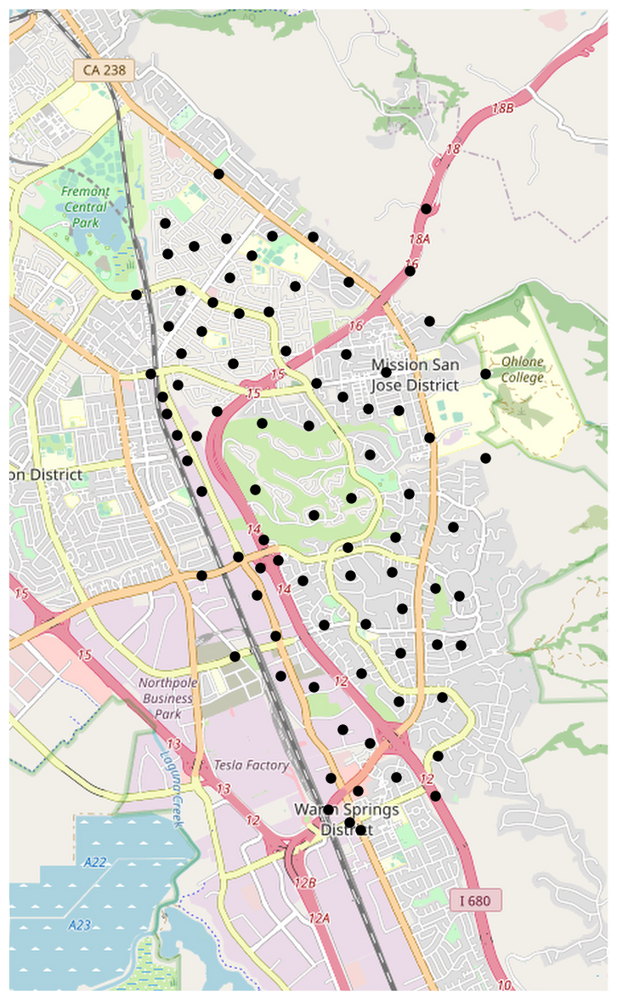

In [47]:
import tilemapbase
tilemapbase.start_logging()
tilemapbase.init(create=True)
extent = tilemapbase.extent_from_frame(frame, buffer=25)

fig, ax = plt.subplots(figsize=(15, 15))
ax.xaxis.set_visible(False)
ax.yaxis.set_visible(False)
plotter = tilemapbase.Plotter(extent, tilemapbase.tiles.build_OSM(), width=400)
plotter.plot(ax)
# frame.plot(ax=ax, column="name", color="0.8")
centroids.plot(ax=ax, color='black', lw=3)
# ax.legend(frame.name)

# ax = frame.plot('name', color='0.8', figsize=(15, 15))
# nodes.to_crs("EPSG:3857").plot(ax=ax, color='yellow', lw=0.01)
# uncoordinated_node_geo.plot(ax=ax, color='red', lw=3)
# plt.title('Uncoordinated nodes')
# plt.axis('off')
plt.show()

In [48]:
calibrated_od_df[(calibrated_od_df['sid']==0) & (calibrated_od_df['nbveh']>0)][['oid', 'eid', 'destination', 'spdh', 'ttime', 'dtime', 'travel']]

,oid,eid,destination,spdh,ttime,dtime,travel
79,151634377,int_0,151635727.0,92.683149,254.547249,21.282066,13.088924
81,151634377,int_0,151635733.0,74.252867,190.034951,50.948261,3.919622
85,151634377,int_0,151635745.0,38.395220,161.413348,79.459261,1.721528
86,151634377,int_0,0.0,65.475774,215.135699,43.242914,18.730075
166,151634402,int_1,151635727.0,52.916627,610.861359,207.971480,17.950058
...,...,...,...,...,...,...,...
546168,151635745,ext_10,151635600.0,40.330586,233.805300,66.719032,96.938029
546170,151635745,ext_10,151635648.0,53.051312,23.416811,3.675807,1.725406
546172,151635745,ext_10,151635666.0,33.211624,215.885500,99.185398,46.280489
546173,151635745,ext_10,151635689.0,43.501310,237.550346,78.014179,74.283580


In [49]:
dfs_od = {'uncoordinated': uncoordinated_od_df, 'calibrated': calibrated_od_df}
od_columns = {
    'oid': Column('oid', 'Origin centroid identifier', None),
    'eid': Column('eid', 'Origin centroid external ID', None),
    'destination': Column('destination', 'Destination centroid identifier', None),
    'speed': Column('speed', 'Mean speed', 'km/h'),
    'ttime': Column('ttime', 'Mean travel time', 's'),
    'dtime': Column('dtime', 'Mean delay time', 's')
}
od_column_names = list(od_columns.keys())

mean_dist = Column('mean_dist', 'Mean travel distance', 'km')

def preprocess_od(df):
    df = df[(df['sid']==0) & (df['nbveh']>0)][od_column_names]
    df['mean_dist'] = df['speed'] * df['ttime'] / 3600
    df['oid'] = df['oid'].astype(int)
    df['destination'] = df['destination'].astype(int)
    return df

for k, df in dfs_od.items():
    dfs_od[k] = preprocess_od(df)

dfs_od['uncoordinated']

,oid,eid,destination,speed,ttime,dtime,mean_dist
79,151634377,int_0,151635727,92.354351,257.477739,24.204354,6.605330
81,151634377,int_0,151635733,44.388216,317.837200,178.763933,3.918952
85,151634377,int_0,151635745,41.809689,148.246362,66.308671,1.721704
86,151634377,int_0,0,67.726652,245.259760,73.370328,4.614062
166,151634402,int_1,151635727,51.018652,621.714604,210.039434,8.810845
...,...,...,...,...,...,...,...
546168,151635745,ext_10,151635600,39.247670,272.716084,103.902120,2.973186
546170,151635745,ext_10,151635648,55.183013,23.320849,3.579845,0.357476
546172,151635745,ext_10,151635666,38.882711,193.086533,75.910481,2.085480
546173,151635745,ext_10,151635689,38.088003,313.202431,121.040948,3.313682


In [50]:
dfs_od['calibrated']

,oid,eid,destination,speed,ttime,dtime,mean_dist
79,151634377,int_0,151635727,93.440063,254.547249,21.282066,6.606920
81,151634377,int_0,151635733,74.252867,190.034951,50.948261,3.919622
85,151634377,int_0,151635745,38.395220,161.413348,79.459261,1.721528
86,151634377,int_0,0,74.882053,215.135699,43.242914,4.474945
166,151634402,int_1,151635727,52.950571,610.861359,207.971480,8.984849
...,...,...,...,...,...,...,...
546168,151635745,ext_10,151635600,41.900964,233.805300,66.719032,2.721296
546170,151635745,ext_10,151635648,54.411089,23.416811,3.675807,0.353926
546172,151635745,ext_10,151635666,36.619913,215.885500,99.185398,2.196030
546173,151635745,ext_10,151635689,45.250988,237.550346,78.014179,2.985941


In [51]:
od_columns_compare = {
    'speed': od_columns['speed'],
    'ttime': od_columns['ttime'],
    'dtime': od_columns['dtime'],
    'mean_dist': mean_dist
}

od_df = dfs_od['uncoordinated'][od_columns_compare].join(
    dfs_od['calibrated'][od_columns_compare], lsuffix='_uncoordinated', rsuffix='_calibrated')

for k in od_columns:
    if k not in od_columns_compare:
        od_df[k] = dfs_od['uncoordinated'][k]

for k in od_columns_compare:
    od_df[f'{k}_ratio'] = od_df[f'{k}_calibrated'] / od_df[f'{k}_uncoordinated']

od_df

C:\Users\prest\AppData\Local\Temp\ipykernel_23144\3333267968.py:8: FutureWarning: Passing a dict as an indexer is deprecated and will raise in a future version. Use a list instead.
  od_df = dfs_od['uncoordinated'][od_columns_compare].join(
C:\Users\prest\AppData\Local\Temp\ipykernel_23144\3333267968.py:9: FutureWarning: Passing a dict as an indexer is deprecated and will raise in a future version. Use a list instead.
  dfs_od['calibrated'][od_columns_compare], lsuffix='_uncoordinated', rsuffix='_calibrated')


,speed_uncoordinated,ttime_uncoordinated,dtime_uncoordinated,mean_dist_uncoordinated,speed_calibrated,ttime_calibrated,dtime_calibrated,mean_dist_calibrated,oid,eid,destination,speed_ratio,ttime_ratio,dtime_ratio,mean_dist_ratio
79,92.354351,257.477739,24.204354,6.605330,93.440063,254.547249,21.282066,6.606920,151634377,int_0,151635727,1.011756,0.988618,0.879266,1.000241
81,44.388216,317.837200,178.763933,3.918952,74.252867,190.034951,50.948261,3.919622,151634377,int_0,151635733,1.672806,0.597900,0.285003,1.000171
85,41.809689,148.246362,66.308671,1.721704,38.395220,161.413348,79.459261,1.721528,151634377,int_0,151635745,0.918333,1.088818,1.198324,0.999898
86,67.726652,245.259760,73.370328,4.614062,74.882053,215.135699,43.242914,4.474945,151634377,int_0,0,1.105651,0.877175,0.589379,0.969849
166,51.018652,621.714604,210.039434,8.810845,52.950571,610.861359,207.971480,8.984849,151634402,int_1,151635727,1.037867,0.982543,0.990154,1.019749
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
546168,39.247670,272.716084,103.902120,2.973186,41.900964,233.805300,66.719032,2.721296,151635745,ext_10,151635600,1.067604,0.857321,0.642133,0.915279
546170,55.183013,23.320849,3.579845,0.357476,54.411089,23.416811,3.675807,0.353926,151635745,ext_10,151635648,0.986012,1.004115,1.026806,0.990069
546172,38.882711,193.086533,75.910481,2.085480,36.619913,215.885500,99.185398,2.196030,151635745,ext_10,151635666,0.941805,1.118076,1.306610,1.053009
546173,38.088003,313.202431,121.040948,3.313682,45.250988,237.550346,78.014179,2.985941,151635745,ext_10,151635689,1.188064,0.758456,0.644527,0.901095


In [52]:
def most_impacted(metric_name, n):
    df = od_df[['oid', 'eid', 'destination', f'{metric_name}_ratio']].sort_values(by=f'{metric_name}_ratio')
    df.replace([np.inf, -np.inf], np.nan, inplace=True)
    df.dropna(inplace=True)
    return df.head(n), df.tail(n)

speed_head, speed_tail = most_impacted('speed', 30)
ttime_head, ttime_tail = most_impacted('ttime', 30)
dtime_head, dtime_tail = most_impacted('dtime', 30)
mean_dist_head, mean_dist_tail = most_impacted('mean_dist', 30)

In [53]:
speed_head

,oid,eid,destination,speed_ratio
365650,151635689,int_74,151635718,0.120724
522910,151635718,ext_1,151635184,0.123691
478801,151635745,ext_10,151635184,0.125340
455798,151635727,ext_4,151634526,0.133463
455539,151635718,ext_1,151634562,0.150605
477882,151635689,int_74,151635724,0.174178
381661,151634377,int_0,151635727,0.196858
473443,151634856,int_23,151635718,0.209123
455800,151635727,ext_4,151634562,0.216418
388201,151635718,ext_1,151634562,0.252212


In [54]:
speed_tail

,oid,eid,destination,speed_ratio
500725,151635727,ext_4,151635184,2.568329
73950,151635718,ext_1,151634377,2.568910
298784,151635730,ext_5,151634913,2.572595
500590,151635721,ext_2,151635727,2.648240
51568,151635718,ext_1,151635521,2.655512
29337,151635727,ext_4,151634773,2.662807
500464,151635718,ext_1,151635184,2.674164
118865,151635718,ext_1,151634856,2.694929
26181,151635210,int_42,151635733,2.722103
29383,151635727,ext_4,151635521,2.759648


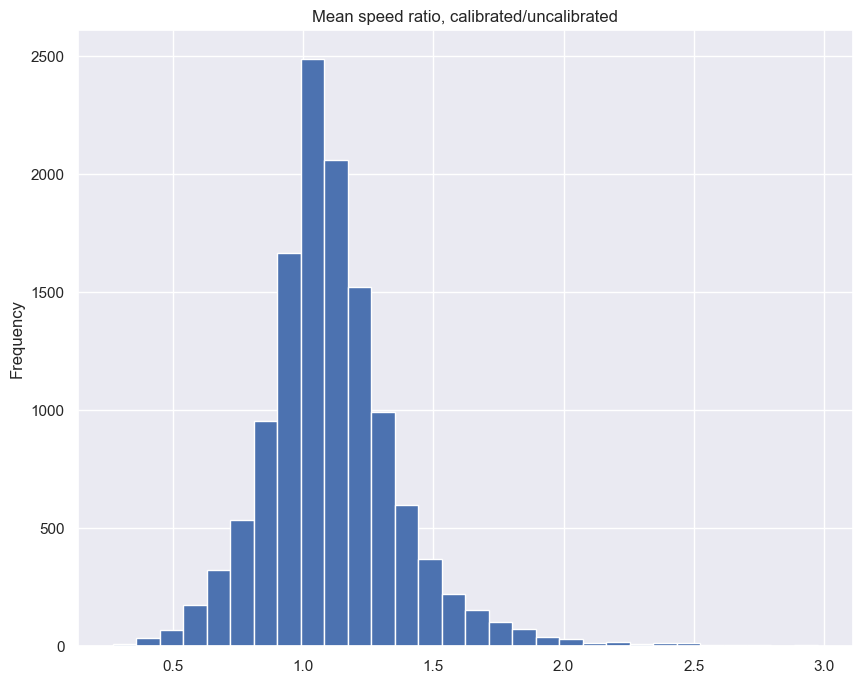

In [55]:
def plot(metric_name):
    metric_data = od_df[f'{metric_name}_ratio']
    low, high = metric_data.quantile(0.001), metric_data.quantile(0.999)
    metric_data[(low<=metric_data) & (metric_data<=high)].plot.hist(bins=30, figsize=(10, 8))
    plt.title(f'{od_columns[metric_name].desc} ratio, calibrated/uncalibrated')

    # with curve fitting (https://stackoverflow.com/a/35545265):
    # 
    # def gaussian(x, mean, amplitude, standard_deviation):
    #     return amplitude * np.exp( - (x - mean)**2 / (2*standard_deviation ** 2))

    # metric_data = od_df[f'{metric_name}_ratio']
    # metric_data = metric_data[~is_outlier(metric_data)]
    
    # fig = plt.figure(figsize=(10, 8))
    # bin_heights, bin_borders, _ = plt.hist(metric_data, bins=30)
    # bin_centers = bin_borders[:-1] + np.diff(bin_borders) / 2
    # popt, _ = curve_fit(gaussian, bin_centers, bin_heights, p0=[1., 0., 1.])
    # x_interval_for_fit = np.linspace(bin_borders[0], bin_borders[-1], 10000)

    # plt.title(f'{od_columns[metric_name].desc} ratio, calibrated/uncalibrated (outliers removed)')
    # plt.plot(x_interval_for_fit, gaussian(x_interval_for_fit, *popt), linestyle='dashed')


plot('speed')

In [56]:
ttime_head

,oid,eid,destination,ttime_ratio
385148,151635184,int_40,0,0.084354
450050,151634657,int_12,0,0.133742
500590,151635721,ext_2,151635727,0.140144
500464,151635718,ext_1,151635184,0.163315
298938,151635736,ext_7,151634543,0.173944
543305,151635369,int_52,151635721,0.183404
184171,151635369,int_52,151635727,0.191894
29324,151635727,ext_4,151634526,0.195407
340249,151635184,int_40,151635727,0.196793
186212,151635718,ext_1,151635051,0.200426


In [57]:
ttime_tail

,oid,eid,destination,ttime_ratio
431255,151635403,int_54,151635739,4.807333
456008,151635733,ext_6,151635189,4.912960
433354,151635727,ext_4,151634562,4.944764
298504,151635721,ext_2,151634562,5.051223
455870,151635727,ext_4,151635721,5.186755
545546,151635724,ext_3,151635423,5.385197
494507,151634562,int_7,0,5.551380
181910,151634913,int_26,151635730,5.611321
454744,151635541,int_66,151635736,5.622454
477020,151635521,int_64,0,5.689625


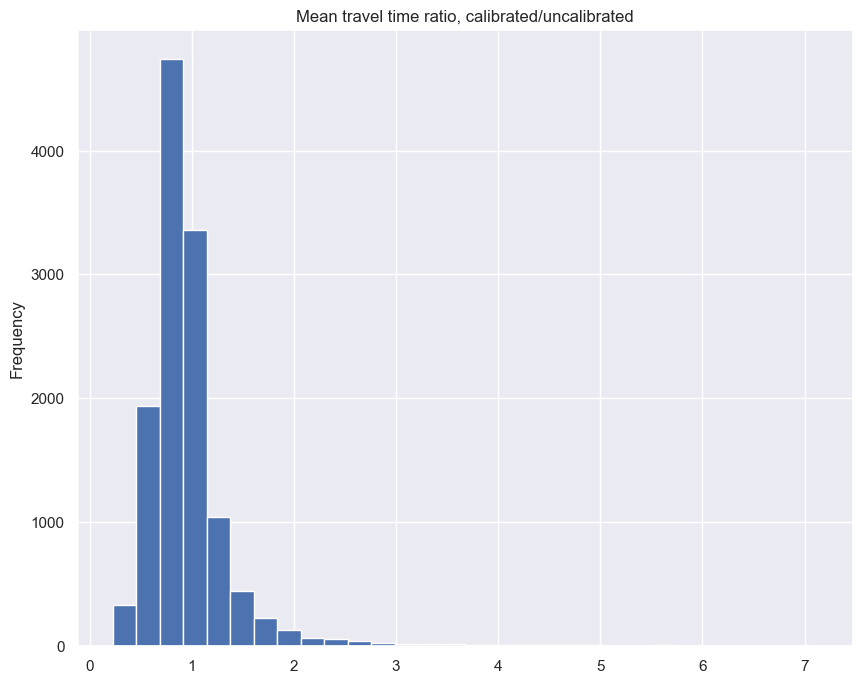

In [58]:
plot('ttime')

In [59]:
dtime_head

,oid,eid,destination,dtime_ratio
141295,151635718,ext_1,151634562,0.000000
7395,151635745,ext_10,151634377,0.004799
456342,151635745,ext_10,151634935,0.007616
385148,151635184,int_40,0,0.009376
432907,151635666,int_73,151635736,0.012855
119625,151635745,ext_10,151634377,0.013979
209080,151635733,ext_6,151634794,0.015503
115965,151635210,int_42,151635733,0.016198
478535,151635736,ext_7,151635122,0.018010
522691,151635666,int_73,151635736,0.019688


In [60]:
dtime_tail

,oid,eid,destination,dtime_ratio
522910,151635718,ext_1,151635184,16.709071
142137,151635745,ext_10,151635541,16.824223
388901,151635742,ext_9,151634638,17.219759
365650,151635689,int_74,151635718,17.773067
1129,151634657,int_12,151635745,17.806989
477796,151635666,int_73,151635727,18.381094
523215,151635727,ext_4,151635742,18.948347
338251,151634742,int_17,151635736,20.769633
276793,151635745,ext_10,151635291,20.849616
248035,151634657,int_12,151635745,21.398293


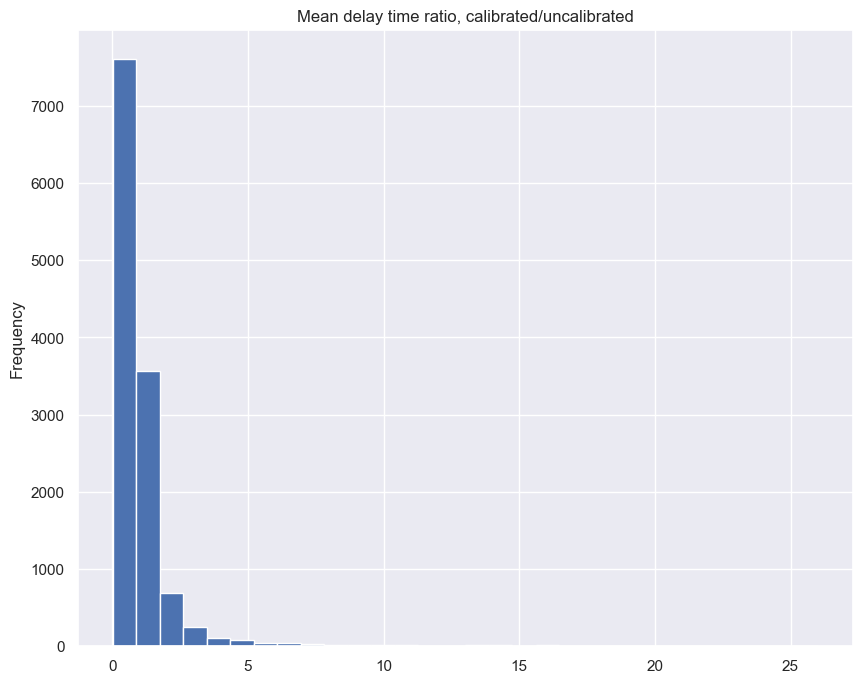

In [61]:
plot('dtime')

In [62]:
def most_impacted(metric_name, n):
    df = od_df[['oid', 'eid', 'destination', f'{metric_name}_ratio', f'{metric_name}_uncoordinated', f'{metric_name}_calibrated']].sort_values(by=f'{metric_name}_ratio')
    df.dropna(inplace=True)
    return df.head(n), df.tail(n)

dtime_head, dtime_tail = most_impacted('dtime', 30)

In [63]:
mean_dist_head

,oid,eid,destination,mean_dist_ratio
450050,151634657,int_12,0,0.140108
543305,151635369,int_52,151635721,0.184874
517987,151634794,int_19,151635718,0.218262
298938,151635736,ext_7,151634543,0.225798
497895,151635291,int_46,151635733,0.233610
411469,151635745,ext_10,151635291,0.234349
365962,151635724,ext_3,151635184,0.247397
385148,151635184,int_40,0,0.256999
363219,151635291,int_46,151635733,0.266870
429344,151635051,int_32,0,0.270434


In [64]:
mean_dist_tail

,oid,eid,destination,mean_dist_ratio
472844,151634723,int_16,0,3.196052
476498,151635443,int_58,0,3.216850
343595,151635727,ext_4,151635051,3.257331
455870,151635727,ext_4,151635721,3.337182
70201,151635051,int_32,151635727,3.342916
523036,151635721,ext_2,151635727,3.422053
455905,151635730,ext_5,151634880,3.497579
477020,151635521,int_64,0,3.519747
473540,151634869,int_24,0,3.549448
253724,151635724,ext_3,151635051,3.599012


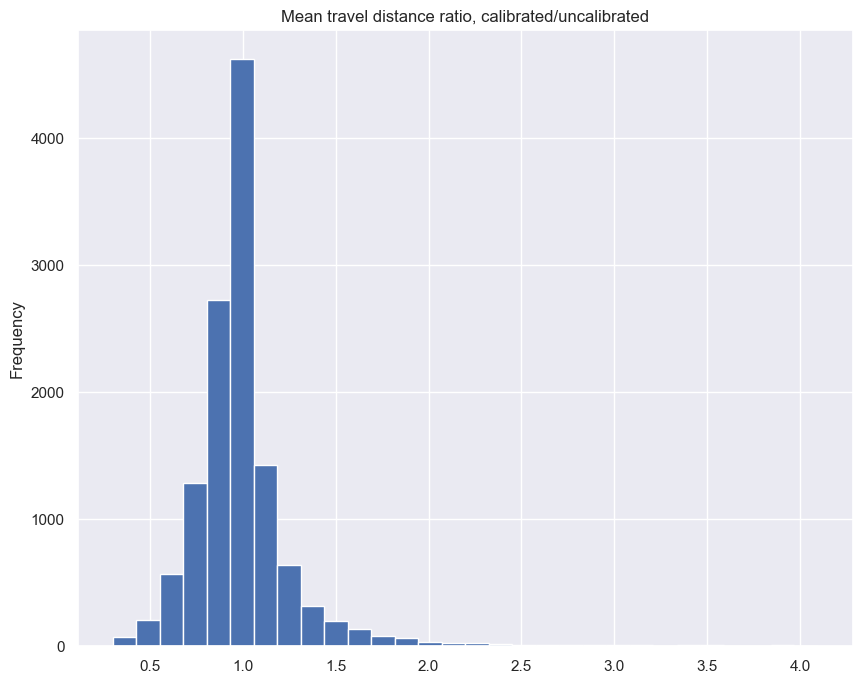

In [65]:
od_columns['mean_dist'] = mean_dist
plot('mean_dist')

In [66]:
centroids = gpd.read_file('C:/Users/prest/Dropbox/Fremont project/Data collection copy/Data/Manually made/Network/Map/Aimsun/centroids.shp')
centroids

,id,eid,name,type,percentage,geometry
0,151630699.0,int_0,int_0,from_to,nothing,POINT (594180.928 4153952.743)
1,151630724.0,int_1,int_1,from_to,nothing,POINT (592545.036 4155899.879)
2,151630733.0,int_2,int_2,from_to,nothing,POINT (595661.828 4152106.190)
3,151630752.0,int_3,int_3,from_to,nothing,POINT (596205.194 4154563.504)
4,151630839.0,int_4,int_4,from_to,nothing,POINT (593310.093 4154654.882)
...,...,...,...,...,...,...
81,151632055.0,ext_6,ext_6,from_to,nothing,POINT (592975.725 4152220.472)
82,151632058.0,ext_7,ext_7,from_to,nothing,POINT (592179.865 4155425.934)
83,151632061.0,ext_8,ext_8,from_to,nothing,POINT (593115.025 4156815.397)
84,151632064.0,ext_9,ext_9,from_to,nothing,POINT (595501.160 4156449.955)


In [67]:
od_df[od_df['oid']==151635727]['eid'].unique()

array(['ext_4'], dtype=object)

In [68]:
centroids[centroids['eid']=='ext_4']

,id,eid,name,type,percentage,geometry
79,151632049.0,ext_4,ext_4,from_to,nothing,POINT (595684.167 4149732.229)


In [69]:
od_df

,speed_uncoordinated,ttime_uncoordinated,dtime_uncoordinated,mean_dist_uncoordinated,speed_calibrated,ttime_calibrated,dtime_calibrated,mean_dist_calibrated,oid,eid,destination,speed_ratio,ttime_ratio,dtime_ratio,mean_dist_ratio
79,92.354351,257.477739,24.204354,6.605330,93.440063,254.547249,21.282066,6.606920,151634377,int_0,151635727,1.011756,0.988618,0.879266,1.000241
81,44.388216,317.837200,178.763933,3.918952,74.252867,190.034951,50.948261,3.919622,151634377,int_0,151635733,1.672806,0.597900,0.285003,1.000171
85,41.809689,148.246362,66.308671,1.721704,38.395220,161.413348,79.459261,1.721528,151634377,int_0,151635745,0.918333,1.088818,1.198324,0.999898
86,67.726652,245.259760,73.370328,4.614062,74.882053,215.135699,43.242914,4.474945,151634377,int_0,0,1.105651,0.877175,0.589379,0.969849
166,51.018652,621.714604,210.039434,8.810845,52.950571,610.861359,207.971480,8.984849,151634402,int_1,151635727,1.037867,0.982543,0.990154,1.019749
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
546168,39.247670,272.716084,103.902120,2.973186,41.900964,233.805300,66.719032,2.721296,151635745,ext_10,151635600,1.067604,0.857321,0.642133,0.915279
546170,55.183013,23.320849,3.579845,0.357476,54.411089,23.416811,3.675807,0.353926,151635745,ext_10,151635648,0.986012,1.004115,1.026806,0.990069
546172,38.882711,193.086533,75.910481,2.085480,36.619913,215.885500,99.185398,2.196030,151635745,ext_10,151635666,0.941805,1.118076,1.306610,1.053009
546173,38.088003,313.202431,121.040948,3.313682,45.250988,237.550346,78.014179,2.985941,151635745,ext_10,151635689,1.188064,0.758456,0.644527,0.901095


In [70]:
od_df[od_df['oid']==151635727]

,speed_uncoordinated,ttime_uncoordinated,dtime_uncoordinated,mean_dist_uncoordinated,speed_calibrated,ttime_calibrated,dtime_calibrated,mean_dist_calibrated,oid,eid,destination,speed_ratio,ttime_ratio,dtime_ratio,mean_dist_ratio
6875,44.448167,257.199941,127.462022,3.175574,64.037838,134.138906,27.244072,2.386102,151635727,ext_4,151634411,1.440731,0.521536,0.213743,0.751392
6876,37.320815,486.543143,228.874549,5.043941,68.332362,242.343616,30.470995,4.599975,151635727,ext_4,151634430,1.830945,0.498093,0.133134,0.911980
6877,67.588219,384.494704,52.424421,7.218698,73.579028,353.189121,21.118838,7.218698,151635727,ext_4,151634517,1.088637,0.918580,0.402844,1.000000
6878,61.204145,124.638857,14.300421,2.119004,58.075985,122.929957,22.015616,1.983133,151635727,ext_4,151634526,0.948890,0.986289,1.539508,0.935880
6879,65.992246,258.557063,74.314427,4.739656,75.695016,217.618974,33.027211,4.575742,151635727,ext_4,151634543,1.147029,0.841667,0.444425,0.965417
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
545654,32.598260,412.755326,233.611947,3.737529,29.982986,719.942810,513.163848,5.996121,151635727,ext_4,151635721,0.919773,1.744236,2.196651,1.604301
545657,54.290743,455.042178,140.823559,6.862383,48.870239,438.214528,157.644866,5.948791,151635727,ext_4,151635730,0.900158,0.963020,1.119450,0.866870
545658,62.024713,267.851414,98.425201,4.614835,67.437706,251.991487,74.206900,4.720480,151635727,ext_4,151635733,1.087272,0.940788,0.753942,1.022892
545661,100.137572,305.978434,17.218999,8.511094,96.729101,327.390893,38.687829,8.796730,151635727,ext_4,151635742,0.965962,1.069980,2.246811,1.033560


In [71]:
od_df = od_df.reset_index(drop=True)
od_df

,speed_uncoordinated,ttime_uncoordinated,dtime_uncoordinated,mean_dist_uncoordinated,speed_calibrated,ttime_calibrated,dtime_calibrated,mean_dist_calibrated,oid,eid,destination,speed_ratio,ttime_ratio,dtime_ratio,mean_dist_ratio
0,92.354351,257.477739,24.204354,6.605330,93.440063,254.547249,21.282066,6.606920,151634377,int_0,151635727,1.011756,0.988618,0.879266,1.000241
1,44.388216,317.837200,178.763933,3.918952,74.252867,190.034951,50.948261,3.919622,151634377,int_0,151635733,1.672806,0.597900,0.285003,1.000171
2,41.809689,148.246362,66.308671,1.721704,38.395220,161.413348,79.459261,1.721528,151634377,int_0,151635745,0.918333,1.088818,1.198324,0.999898
3,67.726652,245.259760,73.370328,4.614062,74.882053,215.135699,43.242914,4.474945,151634377,int_0,0,1.105651,0.877175,0.589379,0.969849
4,51.018652,621.714604,210.039434,8.810845,52.950571,610.861359,207.971480,8.984849,151634402,int_1,151635727,1.037867,0.982543,0.990154,1.019749
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13381,39.247670,272.716084,103.902120,2.973186,41.900964,233.805300,66.719032,2.721296,151635745,ext_10,151635600,1.067604,0.857321,0.642133,0.915279
13382,55.183013,23.320849,3.579845,0.357476,54.411089,23.416811,3.675807,0.353926,151635745,ext_10,151635648,0.986012,1.004115,1.026806,0.990069
13383,38.882711,193.086533,75.910481,2.085480,36.619913,215.885500,99.185398,2.196030,151635745,ext_10,151635666,0.941805,1.118076,1.306610,1.053009
13384,38.088003,313.202431,121.040948,3.313682,45.250988,237.550346,78.014179,2.985941,151635745,ext_10,151635689,1.188064,0.758456,0.644527,0.901095


In [72]:
# for each destination, find a matching oid, find the corresponding eid, and add it to the dataframe
od_df['destination_eid'] = od_df[['destination', 'eid']].merge(od_df.drop_duplicates('oid'), how='left', left_on='destination', right_on='oid')['eid_y']
od_df

,speed_uncoordinated,ttime_uncoordinated,dtime_uncoordinated,mean_dist_uncoordinated,speed_calibrated,ttime_calibrated,dtime_calibrated,mean_dist_calibrated,oid,eid,destination,speed_ratio,ttime_ratio,dtime_ratio,mean_dist_ratio,destination_eid
0,92.354351,257.477739,24.204354,6.605330,93.440063,254.547249,21.282066,6.606920,151634377,int_0,151635727,1.011756,0.988618,0.879266,1.000241,ext_4
1,44.388216,317.837200,178.763933,3.918952,74.252867,190.034951,50.948261,3.919622,151634377,int_0,151635733,1.672806,0.597900,0.285003,1.000171,ext_6
2,41.809689,148.246362,66.308671,1.721704,38.395220,161.413348,79.459261,1.721528,151634377,int_0,151635745,0.918333,1.088818,1.198324,0.999898,ext_10
3,67.726652,245.259760,73.370328,4.614062,74.882053,215.135699,43.242914,4.474945,151634377,int_0,0,1.105651,0.877175,0.589379,0.969849,NaN
4,51.018652,621.714604,210.039434,8.810845,52.950571,610.861359,207.971480,8.984849,151634402,int_1,151635727,1.037867,0.982543,0.990154,1.019749,ext_4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13381,39.247670,272.716084,103.902120,2.973186,41.900964,233.805300,66.719032,2.721296,151635745,ext_10,151635600,1.067604,0.857321,0.642133,0.915279,int_69
13382,55.183013,23.320849,3.579845,0.357476,54.411089,23.416811,3.675807,0.353926,151635745,ext_10,151635648,0.986012,1.004115,1.026806,0.990069,int_71
13383,38.882711,193.086533,75.910481,2.085480,36.619913,215.885500,99.185398,2.196030,151635745,ext_10,151635666,0.941805,1.118076,1.306610,1.053009,int_73
13384,38.088003,313.202431,121.040948,3.313682,45.250988,237.550346,78.014179,2.985941,151635745,ext_10,151635689,1.188064,0.758456,0.644527,0.901095,int_74


In [73]:
od_df.dropna(inplace=True)

In [74]:
centroids[centroids['eid']=='int_0']['geometry']

0    POINT (594180.928 4153952.743)
Name: geometry, dtype: geometry

In [75]:
od_df = od_df.merge(centroids[['eid', 'geometry']], on='eid').rename(columns={'geometry': 'geometry_o'})
od_df = od_df.merge(centroids[['eid', 'geometry']], left_on='destination_eid', right_on='eid').rename(columns={'geometry': 'geometry_d'})
# section_df = gpd.GeoDataFrame(section_df, geometry='geometry')

od_df

,speed_uncoordinated,ttime_uncoordinated,dtime_uncoordinated,mean_dist_uncoordinated,speed_calibrated,ttime_calibrated,dtime_calibrated,mean_dist_calibrated,oid,eid_x,destination,speed_ratio,ttime_ratio,dtime_ratio,mean_dist_ratio,destination_eid,geometry_o,eid_y,geometry_d
0,92.354351,257.477739,24.204354,6.605330,93.440063,254.547249,21.282066,6.606920,151634377,int_0,151635727,1.011756,0.988618,0.879266,1.000241,ext_4,POINT (594180.928 4153952.743),ext_4,POINT (595684.167 4149732.229)
1,89.172549,265.972648,31.863778,6.588183,81.315393,291.288741,57.183318,6.579516,151634377,int_0,151635727,0.911888,1.095183,1.794618,0.998684,ext_4,POINT (594180.928 4153952.743),ext_4,POINT (595684.167 4149732.229)
2,76.966886,306.877376,58.773084,6.560943,62.932030,373.508004,125.150688,6.529338,151634377,int_0,151635727,0.817651,1.217125,2.129388,0.995183,ext_4,POINT (594180.928 4153952.743),ext_4,POINT (595684.167 4149732.229)
3,68.759229,345.092659,102.651440,6.591196,81.286639,292.955712,45.854055,6.614829,151634377,int_0,151635727,1.182192,0.848919,0.446697,1.003586,ext_4,POINT (594180.928 4153952.743),ext_4,POINT (595684.167 4149732.229)
4,59.327889,403.095394,117.259565,6.643000,62.085842,373.821127,118.218548,6.446944,151634377,int_0,151635727,1.046487,0.927376,1.008178,0.970487,ext_4,POINT (594180.928 4153952.743),ext_4,POINT (595684.167 4149732.229)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10939,55.183013,23.320849,3.579845,0.357476,54.411089,23.416811,3.675807,0.353926,151635745,ext_10,151635648,0.986012,1.004115,1.026806,0.990069,int_71,POINT (592356.096 4154524.181),int_71,POINT (592500.283 4154266.046)
10940,73.728056,199.538677,6.386270,4.086555,70.606917,208.360450,15.207546,4.086580,151635727,ext_4,151634698,0.957667,1.044211,2.381288,1.000006,int_15,POINT (595684.167 4149732.229),int_15,POINT (594252.375 4152933.135)
10941,73.728056,199.538677,6.386270,4.086555,70.606917,208.360450,15.207546,4.086580,151635727,ext_4,151634698,0.957667,1.044211,2.381288,1.000006,int_15,POINT (595684.167 4149732.229),int_15,POINT (594252.375 4152933.135)
10942,57.735316,332.248742,35.947074,5.328468,35.716851,377.879555,98.570492,3.749074,151635745,ext_10,151634698,0.618631,1.137339,2.742101,0.703593,int_15,POINT (592356.096 4154524.181),int_15,POINT (594252.375 4152933.135)


In [76]:
from shapely.geometry import Point, LineString, Polygon

od_df['geometry'] = od_df[['geometry_o', 'geometry_d']].apply(lambda *args: LineString(*args), axis=1)
od_df

,speed_uncoordinated,ttime_uncoordinated,dtime_uncoordinated,mean_dist_uncoordinated,speed_calibrated,ttime_calibrated,dtime_calibrated,mean_dist_calibrated,oid,eid_x,destination,speed_ratio,ttime_ratio,dtime_ratio,mean_dist_ratio,destination_eid,geometry_o,eid_y,geometry_d,geometry
0,92.354351,257.477739,24.204354,6.605330,93.440063,254.547249,21.282066,6.606920,151634377,int_0,151635727,1.011756,0.988618,0.879266,1.000241,ext_4,POINT (594180.928 4153952.743),ext_4,POINT (595684.167 4149732.229),LINESTRING (594180.9279909714 4153952.74253129...
1,89.172549,265.972648,31.863778,6.588183,81.315393,291.288741,57.183318,6.579516,151634377,int_0,151635727,0.911888,1.095183,1.794618,0.998684,ext_4,POINT (594180.928 4153952.743),ext_4,POINT (595684.167 4149732.229),LINESTRING (594180.9279909714 4153952.74253129...
2,76.966886,306.877376,58.773084,6.560943,62.932030,373.508004,125.150688,6.529338,151634377,int_0,151635727,0.817651,1.217125,2.129388,0.995183,ext_4,POINT (594180.928 4153952.743),ext_4,POINT (595684.167 4149732.229),LINESTRING (594180.9279909714 4153952.74253129...
3,68.759229,345.092659,102.651440,6.591196,81.286639,292.955712,45.854055,6.614829,151634377,int_0,151635727,1.182192,0.848919,0.446697,1.003586,ext_4,POINT (594180.928 4153952.743),ext_4,POINT (595684.167 4149732.229),LINESTRING (594180.9279909714 4153952.74253129...
4,59.327889,403.095394,117.259565,6.643000,62.085842,373.821127,118.218548,6.446944,151634377,int_0,151635727,1.046487,0.927376,1.008178,0.970487,ext_4,POINT (594180.928 4153952.743),ext_4,POINT (595684.167 4149732.229),LINESTRING (594180.9279909714 4153952.74253129...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10939,55.183013,23.320849,3.579845,0.357476,54.411089,23.416811,3.675807,0.353926,151635745,ext_10,151635648,0.986012,1.004115,1.026806,0.990069,int_71,POINT (592356.096 4154524.181),int_71,POINT (592500.283 4154266.046),LINESTRING (592356.096014848 4154524.181414859...
10940,73.728056,199.538677,6.386270,4.086555,70.606917,208.360450,15.207546,4.086580,151635727,ext_4,151634698,0.957667,1.044211,2.381288,1.000006,int_15,POINT (595684.167 4149732.229),int_15,POINT (594252.375 4152933.135),LINESTRING (595684.1668666241 4149732.22909696...
10941,73.728056,199.538677,6.386270,4.086555,70.606917,208.360450,15.207546,4.086580,151635727,ext_4,151634698,0.957667,1.044211,2.381288,1.000006,int_15,POINT (595684.167 4149732.229),int_15,POINT (594252.375 4152933.135),LINESTRING (595684.1668666241 4149732.22909696...
10942,57.735316,332.248742,35.947074,5.328468,35.716851,377.879555,98.570492,3.749074,151635745,ext_10,151634698,0.618631,1.137339,2.742101,0.703593,int_15,POINT (592356.096 4154524.181),int_15,POINT (594252.375 4152933.135),LINESTRING (592356.096014848 4154524.181414859...


In [77]:
od_df.rename(columns={'eid_x': 'eid'})
del od_df['eid_y']
od_df

,speed_uncoordinated,ttime_uncoordinated,dtime_uncoordinated,mean_dist_uncoordinated,speed_calibrated,ttime_calibrated,dtime_calibrated,mean_dist_calibrated,oid,eid_x,destination,speed_ratio,ttime_ratio,dtime_ratio,mean_dist_ratio,destination_eid,geometry_o,geometry_d,geometry
0,92.354351,257.477739,24.204354,6.605330,93.440063,254.547249,21.282066,6.606920,151634377,int_0,151635727,1.011756,0.988618,0.879266,1.000241,ext_4,POINT (594180.928 4153952.743),POINT (595684.167 4149732.229),LINESTRING (594180.9279909714 4153952.74253129...
1,89.172549,265.972648,31.863778,6.588183,81.315393,291.288741,57.183318,6.579516,151634377,int_0,151635727,0.911888,1.095183,1.794618,0.998684,ext_4,POINT (594180.928 4153952.743),POINT (595684.167 4149732.229),LINESTRING (594180.9279909714 4153952.74253129...
2,76.966886,306.877376,58.773084,6.560943,62.932030,373.508004,125.150688,6.529338,151634377,int_0,151635727,0.817651,1.217125,2.129388,0.995183,ext_4,POINT (594180.928 4153952.743),POINT (595684.167 4149732.229),LINESTRING (594180.9279909714 4153952.74253129...
3,68.759229,345.092659,102.651440,6.591196,81.286639,292.955712,45.854055,6.614829,151634377,int_0,151635727,1.182192,0.848919,0.446697,1.003586,ext_4,POINT (594180.928 4153952.743),POINT (595684.167 4149732.229),LINESTRING (594180.9279909714 4153952.74253129...
4,59.327889,403.095394,117.259565,6.643000,62.085842,373.821127,118.218548,6.446944,151634377,int_0,151635727,1.046487,0.927376,1.008178,0.970487,ext_4,POINT (594180.928 4153952.743),POINT (595684.167 4149732.229),LINESTRING (594180.9279909714 4153952.74253129...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10939,55.183013,23.320849,3.579845,0.357476,54.411089,23.416811,3.675807,0.353926,151635745,ext_10,151635648,0.986012,1.004115,1.026806,0.990069,int_71,POINT (592356.096 4154524.181),POINT (592500.283 4154266.046),LINESTRING (592356.096014848 4154524.181414859...
10940,73.728056,199.538677,6.386270,4.086555,70.606917,208.360450,15.207546,4.086580,151635727,ext_4,151634698,0.957667,1.044211,2.381288,1.000006,int_15,POINT (595684.167 4149732.229),POINT (594252.375 4152933.135),LINESTRING (595684.1668666241 4149732.22909696...
10941,73.728056,199.538677,6.386270,4.086555,70.606917,208.360450,15.207546,4.086580,151635727,ext_4,151634698,0.957667,1.044211,2.381288,1.000006,int_15,POINT (595684.167 4149732.229),POINT (594252.375 4152933.135),LINESTRING (595684.1668666241 4149732.22909696...
10942,57.735316,332.248742,35.947074,5.328468,35.716851,377.879555,98.570492,3.749074,151635745,ext_10,151634698,0.618631,1.137339,2.742101,0.703593,int_15,POINT (592356.096 4154524.181),POINT (594252.375 4152933.135),LINESTRING (592356.096014848 4154524.181414859...


In [78]:
od_df = gpd.GeoDataFrame(od_df, geometry='geometry')
od_df.crs = 'EPSG:3857'
od_df

,speed_uncoordinated,ttime_uncoordinated,dtime_uncoordinated,mean_dist_uncoordinated,speed_calibrated,ttime_calibrated,dtime_calibrated,mean_dist_calibrated,oid,eid_x,destination,speed_ratio,ttime_ratio,dtime_ratio,mean_dist_ratio,destination_eid,geometry_o,geometry_d,geometry
0,92.354351,257.477739,24.204354,6.605330,93.440063,254.547249,21.282066,6.606920,151634377,int_0,151635727,1.011756,0.988618,0.879266,1.000241,ext_4,POINT (594180.928 4153952.743),POINT (595684.167 4149732.229),"LINESTRING (594180.928 4153952.743, 595684.167..."
1,89.172549,265.972648,31.863778,6.588183,81.315393,291.288741,57.183318,6.579516,151634377,int_0,151635727,0.911888,1.095183,1.794618,0.998684,ext_4,POINT (594180.928 4153952.743),POINT (595684.167 4149732.229),"LINESTRING (594180.928 4153952.743, 595684.167..."
2,76.966886,306.877376,58.773084,6.560943,62.932030,373.508004,125.150688,6.529338,151634377,int_0,151635727,0.817651,1.217125,2.129388,0.995183,ext_4,POINT (594180.928 4153952.743),POINT (595684.167 4149732.229),"LINESTRING (594180.928 4153952.743, 595684.167..."
3,68.759229,345.092659,102.651440,6.591196,81.286639,292.955712,45.854055,6.614829,151634377,int_0,151635727,1.182192,0.848919,0.446697,1.003586,ext_4,POINT (594180.928 4153952.743),POINT (595684.167 4149732.229),"LINESTRING (594180.928 4153952.743, 595684.167..."
4,59.327889,403.095394,117.259565,6.643000,62.085842,373.821127,118.218548,6.446944,151634377,int_0,151635727,1.046487,0.927376,1.008178,0.970487,ext_4,POINT (594180.928 4153952.743),POINT (595684.167 4149732.229),"LINESTRING (594180.928 4153952.743, 595684.167..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10939,55.183013,23.320849,3.579845,0.357476,54.411089,23.416811,3.675807,0.353926,151635745,ext_10,151635648,0.986012,1.004115,1.026806,0.990069,int_71,POINT (592356.096 4154524.181),POINT (592500.283 4154266.046),"LINESTRING (592356.096 4154524.181, 592500.283..."
10940,73.728056,199.538677,6.386270,4.086555,70.606917,208.360450,15.207546,4.086580,151635727,ext_4,151634698,0.957667,1.044211,2.381288,1.000006,int_15,POINT (595684.167 4149732.229),POINT (594252.375 4152933.135),"LINESTRING (595684.167 4149732.229, 594252.375..."
10941,73.728056,199.538677,6.386270,4.086555,70.606917,208.360450,15.207546,4.086580,151635727,ext_4,151634698,0.957667,1.044211,2.381288,1.000006,int_15,POINT (595684.167 4149732.229),POINT (594252.375 4152933.135),"LINESTRING (595684.167 4149732.229, 594252.375..."
10942,57.735316,332.248742,35.947074,5.328468,35.716851,377.879555,98.570492,3.749074,151635745,ext_10,151634698,0.618631,1.137339,2.742101,0.703593,int_15,POINT (592356.096 4154524.181),POINT (594252.375 4152933.135),"LINESTRING (592356.096 4154524.181, 594252.375..."


In [79]:
od_df.groupby(['eid_x', 'destination_eid']).size().reset_index(name='num_trips')

,eid_x,destination_eid,num_trips
0,ext_1,ext_4,25
1,ext_1,ext_9,25
2,ext_1,int_0,21
3,ext_1,int_1,17
4,ext_1,int_11,18
...,...,...,...
976,int_8,ext_5,4
977,int_8,ext_6,16
978,int_8,ext_7,13
979,int_8,ext_8,6


In [80]:
od_df.groupby(['eid_x', 'destination_eid']).mean().reset_index()

,eid_x,destination_eid,speed_uncoordinated,ttime_uncoordinated,dtime_uncoordinated,mean_dist_uncoordinated,speed_calibrated,ttime_calibrated,dtime_calibrated,mean_dist_calibrated,oid,destination,speed_ratio,ttime_ratio,dtime_ratio,mean_dist_ratio
0,ext_1,ext_4,48.778798,163.210490,90.817489,2.031444,42.496225,262.883802,177.046686,2.323546,151635718.0,151635727.0,0.840539,1.571805,1.851174,1.205340
1,ext_1,ext_9,45.897654,938.253990,467.775647,11.639565,54.427772,715.952474,324.511523,10.090063,151635718.0,151635742.0,1.187496,0.769280,0.679786,0.874303
2,ext_1,int_0,43.025971,678.892343,335.646631,7.818878,49.932414,613.973169,248.438069,8.009098,151635718.0,151634377.0,1.198251,0.921094,0.773241,1.040800
3,ext_1,int_1,42.837020,881.051748,368.189862,10.270667,52.599478,680.746820,218.536280,9.728736,151635718.0,151634402.0,1.245540,0.791433,0.667254,0.952332
4,ext_1,int_11,49.901133,740.192400,356.720828,9.640980,54.937338,669.482565,277.734994,9.537157,151635718.0,151634638.0,1.110471,0.907996,0.769636,0.988765
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
976,int_8,ext_5,41.474406,422.262595,138.913396,4.846292,37.333582,546.683674,251.828521,4.940200,151634607.0,151635730.0,0.892083,1.251267,1.946610,1.016306
977,int_8,ext_6,35.815211,430.338663,178.979433,4.256666,47.966523,300.523031,85.083485,3.921009,151634607.0,151635733.0,1.350675,0.714359,0.518277,0.933307
978,int_8,ext_7,38.006582,578.057284,184.488285,6.022252,47.106841,467.583769,84.550161,6.061897,151634607.0,151635736.0,1.256080,0.825821,0.541878,1.014458
979,int_8,ext_8,38.503184,528.822492,166.538630,5.620882,45.408950,379.243827,91.349031,4.757369,151634607.0,151635739.0,1.185465,0.725911,0.548121,0.854182


In [81]:
od_df.sort_values('speed_ratio')

,speed_uncoordinated,ttime_uncoordinated,dtime_uncoordinated,mean_dist_uncoordinated,speed_calibrated,ttime_calibrated,dtime_calibrated,mean_dist_calibrated,oid,eid_x,destination,speed_ratio,ttime_ratio,dtime_ratio,mean_dist_ratio,destination_eid,geometry_o,geometry_d,geometry
3205,28.732685,791.754989,397.093688,6.319235,3.468735,7487.245630,7057.572558,7.214242,151635689,int_74,151635718,0.120724,9.456518,17.773067,1.141632,ext_1,POINT (595063.619 4154575.824),POINT (594457.347 4149562.362),"LINESTRING (595063.619 4154575.824, 594457.347..."
6365,52.009781,36.916287,14.346550,0.533336,6.433135,263.118205,239.717524,0.470187,151635718,ext_1,151635184,0.123691,7.127429,16.709071,0.881598,int_40,POINT (594457.347 4149562.362),POINT (594803.056 4149777.261),"LINESTRING (594457.347 4149562.362, 594803.056..."
6434,50.993068,598.964093,198.594660,8.484171,6.391492,5104.014778,4616.633175,9.061741,151635745,ext_10,151635184,0.125340,8.521404,23.246512,1.068076,int_40,POINT (592356.096 4154524.181),POINT (594803.056 4149777.261),"LINESTRING (592356.096 4154524.181, 594803.056..."
7775,65.822986,313.845190,42.949764,5.738397,8.784955,4265.594673,3635.893149,10.409183,151635727,ext_4,151634526,0.133463,13.591397,84.654554,1.813953,int_5,POINT (595684.167 4149732.229),POINT (595265.212 4151362.353),"LINESTRING (595684.167 4149732.229, 595265.212..."
5679,27.955059,98.647556,53.997541,0.766027,4.210178,832.622655,763.555400,0.973747,151635718,ext_1,151634562,0.150605,8.440378,14.140559,1.271165,int_7,POINT (594457.347 4149562.362),POINT (595234.984 4149939.736),"LINESTRING (594457.347 4149562.362, 595234.984..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1405,13.309894,166.725577,132.626157,0.616417,53.352332,41.295047,7.489109,0.611996,151635291,int_46,151635733,4.008472,0.247683,0.056468,0.992829,ext_6,POINT (593643.332 4152317.604),POINT (592975.725 4152220.472),"LINESTRING (593643.332 4152317.604, 592975.725..."
7302,12.176857,730.345283,596.739574,2.470364,49.578521,165.764565,30.490371,2.282878,151635727,ext_4,151635521,4.071537,0.226967,0.051095,0.924106,int_64,POINT (595684.167 4149732.229),POINT (595687.140 4151463.150),"LINESTRING (595684.167 4149732.229, 595687.140..."
8749,16.703130,1330.476381,1004.486340,6.173089,69.632313,437.830810,119.356119,8.468659,151635718,ext_1,151635245,4.168818,0.329078,0.118823,1.371867,int_44,POINT (594457.347 4149562.362),POINT (595562.104 4155167.034),"LINESTRING (594457.347 4149562.362, 595562.104..."
7766,12.699611,649.457161,537.074759,2.291070,58.350632,144.991283,40.555221,2.350093,151635727,ext_4,151634526,4.594679,0.223250,0.075511,1.025762,int_5,POINT (595684.167 4149732.229),POINT (595265.212 4151362.353),"LINESTRING (595684.167 4149732.229, 595265.212..."


Below is a big plot that takes a while to run. Instead, I've decided to split into subplots and save them individually.

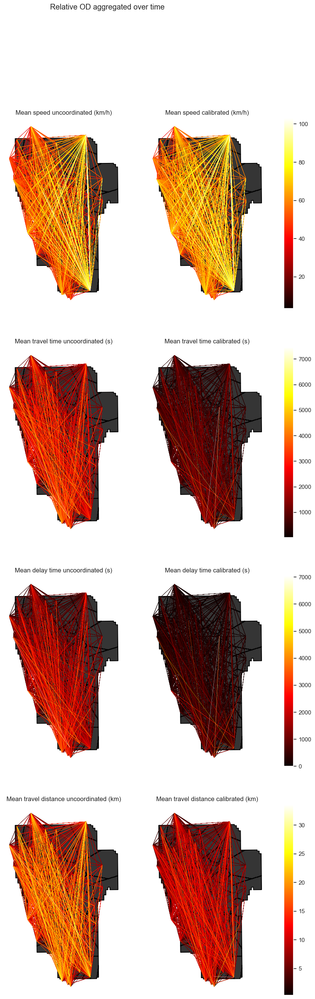

In [82]:
# fig, axs = plt.subplots(4, 2, figsize=(15,30))
# fig.suptitle('Relative OD aggregated over time')
# for i in range(4):
#     for j in range(2):
#         ax, metric = axs[i][j], od_columns[['speed', 'ttime', 'dtime', 'mean_dist'][i]]
#         suffix = ['_uncoordinated', '_calibrated'][j]
#         taz_int.plot(ax=ax, color='#353535', zorder=0)
#         taz_int.boundary.plot(ax=ax, color='black', zorder=1)
#         od_df.sort_values(by=metric.name+suffix).plot(
#             ax=ax, column=metric.name+suffix, legend=(j==1), cmap='hot', lw=0.3, zorder=2)
#         # node_geo_city.plot(ax=ax, color='black', lw=2, zorder=1)
#         ax.set_title(f'{metric.desc} {suffix[1:]} ({metric.unit})')
#         ax.axis('off')

# plt.subplots_adjust(wspace=-.7)
# plt.show()

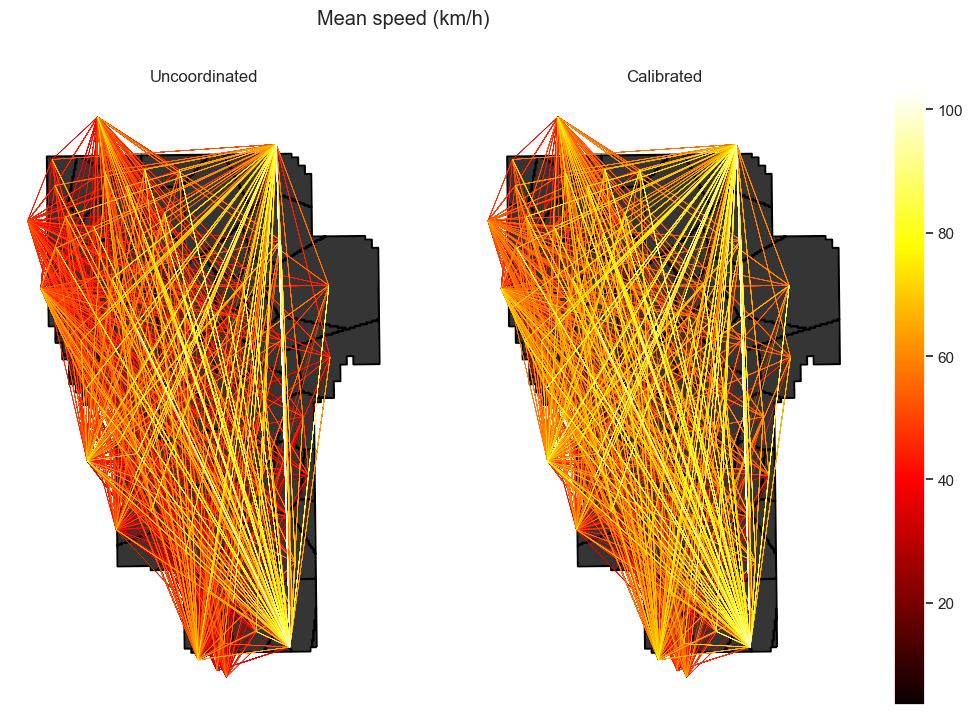

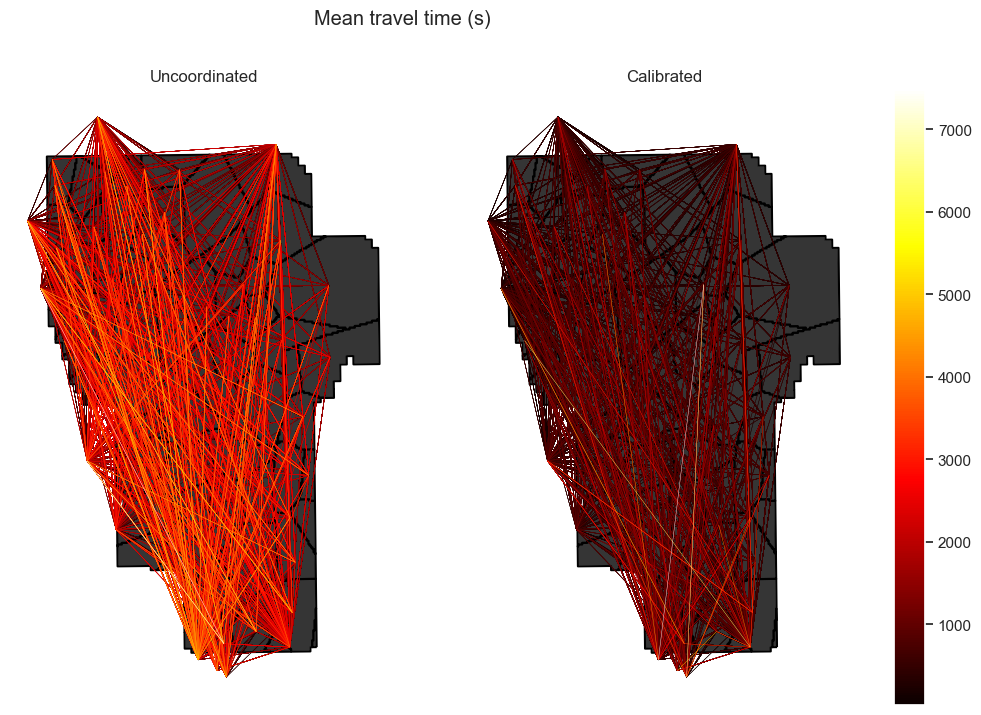

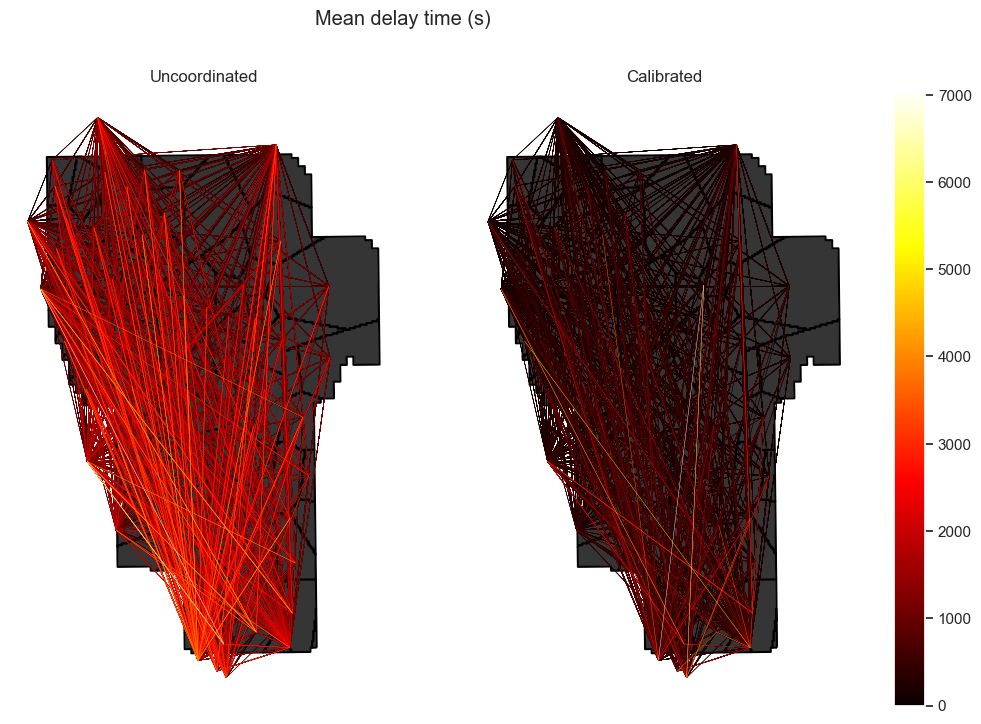

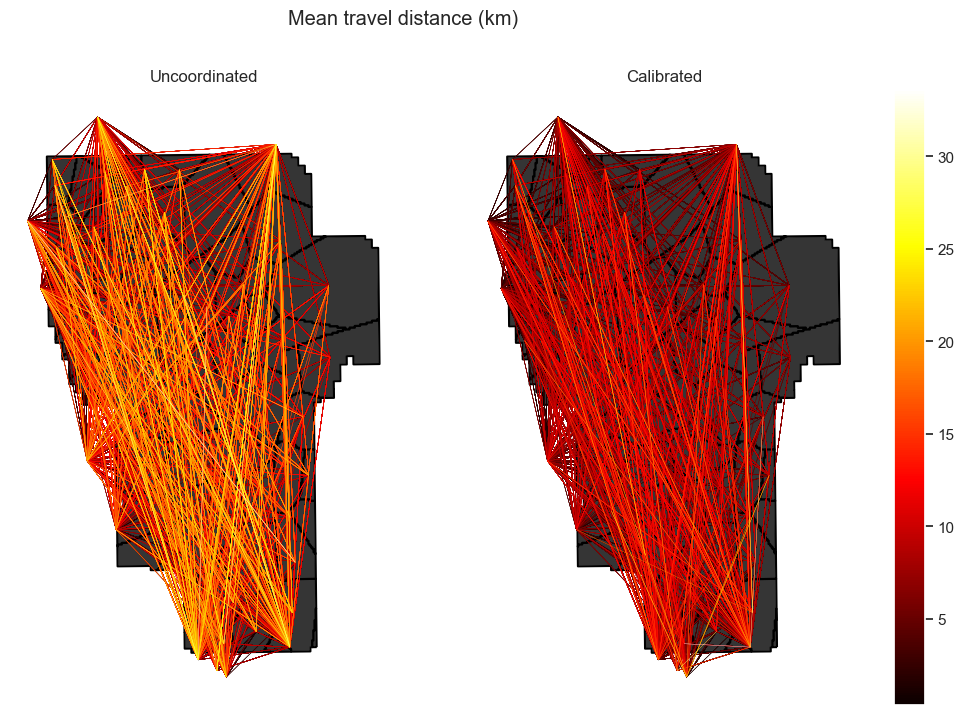

In [83]:
for i in range(4):
    fig, axs = plt.subplots(1, 2, figsize=(15, 8))
    metric = od_columns[['speed', 'ttime', 'dtime', 'mean_dist'][i]]
    fig.suptitle(f'{metric.desc} ({metric.unit})')
    for j in range(2):
        suffix = ['_uncoordinated', '_calibrated'][j]
        label = ['Uncoordinated', 'Calibrated'][j]
        ax = axs[j]
        taz_int.plot(ax=ax, color='#353535', zorder=0)
        taz_int.boundary.plot(ax=ax, color='black', zorder=1)
        od_df.sort_values(by=metric.name+suffix).plot(
            ax=ax, column=metric.name+suffix, legend=(j==1), cmap='hot', lw=0.3, zorder=2)
        ax.set_title(label)
        ax.axis('off')

    plt.subplots_adjust(wspace=-0.4)
    plt.savefig(f'C:\\Users\\prest\\Preston\\Berkeley\\fremont_project\\images\\centroid-{metric.name}.png')
    plt.show()

In [84]:
def plot(metric_name):
    metric_data = od_df[f'{metric_name}_ratio']
    low, high = metric_data.quantile(0.001), metric_data.quantile(0.999)
    metric_data[(low<=metric_data) & (metric_data<=high)].plot.hist(bins=30, figsize=(10, 8))
    plt.title(f'{od_columns[metric_name].desc} ratio, calibrated/uncalibrated')

# Emissions

In [85]:
uncoordinated_emissions_query = pd.read_sql('SELECT * FROM MISYSIEM', uncoordinated_con)
uncoordinated_emissions_df = pd.DataFrame(uncoordinated_emissions_query)

uncoordinated_emissions_df.head()

,did,oid,eid,sid,ent,CO2,CO2_D,NOx,NOx_D,VOC,...,PM,PM_D,CO2_Interurban,CO2_Interurban_D,NOx_Interurban,NOx_Interurban_D,VOC_Interurban,VOC_Interurban_D,PM_Interurban,PM_Interurban_D
0,151642198,151642198,None,0,1,3.342393e+06,0.0,8402.705280,0.0,3075.630456,...,298.803261,0.0,7114.298400,0.0,17.885196,0.0,6.546493,0.0,0.636004,0.0
1,151642198,151642198,None,1,1,8.095161e+05,0.0,1623.464208,0.0,845.544164,...,138.374979,0.0,1723.058662,0.0,3.455551,0.0,1.799745,0.0,0.294532,0.0
2,151642198,151642198,None,2,1,2.532877e+06,0.0,6779.241071,0.0,2230.086292,...,160.428282,0.0,5391.239738,0.0,14.429645,0.0,4.746749,0.0,0.341472,0.0
3,151642198,151642198,None,0,2,4.831124e+06,0.0,11697.674200,0.0,4748.529741,...,533.053621,0.0,10283.068272,0.0,24.898552,0.0,10.107267,0.0,1.134607,0.0
4,151642198,151642198,None,1,2,1.235894e+06,0.0,2352.944623,0.0,1364.102452,...,232.964498,0.0,2630.605878,0.0,5.008253,0.0,2.903498,0.0,0.495866,0.0


In [86]:
calibrated_emissions_query = pd.read_sql('SELECT * FROM MISYSIEM', calibrated_con)
calibrated_emissions_df = pd.DataFrame(calibrated_emissions_query)

calibrated_emissions_df.head()

,did,oid,eid,sid,ent,CO2,CO2_D,NOx,NOx_D,VOC,...,PM,PM_D,CO2_Interurban,CO2_Interurban_D,NOx_Interurban,NOx_Interurban_D,VOC_Interurban,VOC_Interurban_D,PM_Interurban,PM_Interurban_D
0,151642198,151642198,None,0,1,3.312924e+06,0.0,8424.344464,0.0,2959.137792,...,278.308474,0.0,7051.573430,0.0,17.931255,0.0,6.298538,0.0,0.592381,0.0
1,151642198,151642198,None,1,1,7.734094e+05,0.0,1613.710984,0.0,742.857682,...,117.686415,0.0,1646.205352,0.0,3.434791,0.0,1.581176,0.0,0.250496,0.0
2,151642198,151642198,None,2,1,2.539515e+06,0.0,6810.633480,0.0,2216.280111,...,160.622059,0.0,5405.368078,0.0,14.496464,0.0,4.717362,0.0,0.341885,0.0
3,151642198,151642198,None,0,2,4.767444e+06,0.0,11634.532213,0.0,4343.167292,...,483.098574,0.0,10147.526231,0.0,24.764154,0.0,9.244451,0.0,1.028277,0.0
4,151642198,151642198,None,1,2,1.140312e+06,0.0,2197.195397,0.0,1140.552562,...,204.804888,0.0,2427.159246,0.0,4.676740,0.0,2.427671,0.0,0.435928,0.0


In [87]:
uncoordinated_emissions_df

,did,oid,eid,sid,ent,CO2,CO2_D,NOx,NOx_D,VOC,...,PM,PM_D,CO2_Interurban,CO2_Interurban_D,NOx_Interurban,NOx_Interurban_D,VOC_Interurban,VOC_Interurban_D,PM_Interurban,PM_Interurban_D
0,151642198,151642198,None,0,1,3.342393e+06,0.0,8402.705280,0.0,3075.630456,...,298.803261,0.0,7114.298400,0.0,17.885196,0.0,6.546493,0.0,0.636004,0.0
1,151642198,151642198,None,1,1,8.095161e+05,0.0,1623.464208,0.0,845.544164,...,138.374979,0.0,1723.058662,0.0,3.455551,0.0,1.799745,0.0,0.294532,0.0
2,151642198,151642198,None,2,1,2.532877e+06,0.0,6779.241071,0.0,2230.086292,...,160.428282,0.0,5391.239738,0.0,14.429645,0.0,4.746749,0.0,0.341472,0.0
3,151642198,151642198,None,0,2,4.831124e+06,0.0,11697.674200,0.0,4748.529741,...,533.053621,0.0,10283.068272,0.0,24.898552,0.0,10.107267,0.0,1.134607,0.0
4,151642198,151642198,None,1,2,1.235894e+06,0.0,2352.944623,0.0,1364.102452,...,232.964498,0.0,2630.605878,0.0,5.008253,0.0,2.903498,0.0,0.495866,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
70,151642198,151642198,None,1,24,1.109707e+06,0.0,2015.328214,0.0,1991.153238,...,170.747171,0.0,2362.015323,0.0,4.289635,0.0,4.238179,0.0,0.363436,0.0
71,151642198,151642198,None,2,24,2.859935e+06,0.0,7302.080389,0.0,3800.888613,...,210.621625,0.0,6087.384960,0.0,15.542511,0.0,8.090208,0.0,0.448309,0.0
72,151642198,151642198,None,0,0,0.000000e+00,0.0,0.000000,0.0,0.000000,...,0.000000,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.0
73,151642198,151642198,None,1,0,0.000000e+00,0.0,0.000000,0.0,0.000000,...,0.000000,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.0


In [88]:
dfs_emissions = {'uncoordinated': uncoordinated_emissions_df, 'calibrated': calibrated_emissions_df}
emissions_columns = {
    'CO2': Column('CO2', 'Carbon Dioxide Emissions', 'g'),
    'NOx': Column('NOx', 'Carbon Dioxide Emissions', 'g'),
    'VOC': Column('VOC', 'Carbon Dioxide Emissions', 'g'),
    'PM': Column('PM', 'Carbon Dioxide Emissions', 'g'),
    'CO2_Interurban': Column('CO2_Interurban', 'Carbon Dioxide Emissions', 'g/km'),
    'NOx_Interurban': Column('NOx_Interurban', 'Carbon Dioxide Emissions', 'g/km'),
    'VOC_Interurban': Column('VOC_Interurban', 'Carbon Dioxide Emissions', 'g/km'),
    'PM_Interurban': Column('PM_Interurban', 'Carbon Dioxide Emissions', 'g/km')
}
emissions_column_names = list(emissions_columns.keys())

def preprocess_emissions(df):
    df = df[(df['sid']==0) & (df['ent']!=0)][emissions_column_names + ['ent']]
    return df

for k, df in dfs_emissions.items():
    dfs_emissions[k] = preprocess_emissions(df)

dfs_emissions['uncoordinated']

,CO2,NOx,VOC,PM,CO2_Interurban,NOx_Interurban,VOC_Interurban,PM_Interurban,ent
0,3.342393e+06,8402.705280,3075.630456,298.803261,7114.298400,17.885196,6.546493,0.636004,1
3,4.831124e+06,11697.674200,4748.529741,533.053621,10283.068272,24.898552,10.107267,1.134607,2
6,5.134398e+06,12441.165966,5182.334885,587.228244,10928.588234,26.481078,11.030623,1.249918,3
9,5.417650e+06,12560.878848,5700.733341,663.344498,11531.491364,26.735887,12.134037,1.411932,4
12,5.406635e+06,12266.864517,5811.335918,662.090420,11508.046866,26.110076,12.369455,1.409262,5
15,5.809832e+06,13475.332860,6182.678871,744.344053,12366.253503,28.682306,13.159860,1.584340,6
18,5.845720e+06,12942.566219,6418.881580,748.258165,12442.640852,27.548310,13.662618,1.592671,7
21,6.266388e+06,14019.653171,6765.371109,871.073134,13338.034357,29.840895,14.400123,1.854083,8
24,5.794831e+06,12847.133599,6250.449619,770.505350,12334.323861,27.345182,13.304110,1.640024,9
27,5.789330e+06,12695.652269,6357.509447,762.118650,12322.614420,27.022753,13.531987,1.622173,10


In [89]:
dfs_emissions['calibrated']

,CO2,NOx,VOC,PM,CO2_Interurban,NOx_Interurban,VOC_Interurban,PM_Interurban,ent
0,3.312924e+06,8424.344464,2959.137792,278.308474,7051.573430,17.931255,6.298538,0.592381,1
3,4.767444e+06,11634.532213,4343.167292,483.098574,10147.526231,24.764154,9.244451,1.028277,2
6,4.856284e+06,12013.627561,4401.796085,470.660431,10336.622067,25.571060,9.369243,1.001803,3
9,5.062313e+06,12141.182378,4669.693029,553.843080,10775.156939,25.842561,9.939463,1.178857,4
12,4.973077e+06,11687.166463,4679.311522,528.670142,10585.216103,24.876186,9.959936,1.125277,5
15,5.355460e+06,12970.465335,4906.082118,620.050517,11399.121605,27.607694,10.442618,1.319780,6
18,5.303022e+06,12146.126869,5114.111480,597.297341,11287.505239,25.853086,10.885409,1.271350,7
21,5.582756e+06,12714.990574,5593.292122,677.403764,11882.920745,27.063915,11.905347,1.441857,8
24,5.283736e+06,11961.468984,5327.579305,648.242747,11246.456395,25.460040,11.339776,1.379788,9
27,5.387478e+06,12299.943004,5346.137302,620.586810,11467.270077,26.180484,11.379277,1.320922,10


In [90]:
emissions_df = dfs_emissions['uncoordinated'][emissions_column_names].join(
    dfs_emissions['calibrated'][emissions_column_names], lsuffix='_uncoordinated', rsuffix='_calibrated')

for metric_name in emissions_column_names:
    emissions_df[f'{metric_name}_ratio'] = emissions_df[f'{metric_name}_calibrated'] / emissions_df[f'{metric_name}_uncoordinated']

emissions_df

,CO2_uncoordinated,NOx_uncoordinated,VOC_uncoordinated,PM_uncoordinated,CO2_Interurban_uncoordinated,NOx_Interurban_uncoordinated,VOC_Interurban_uncoordinated,PM_Interurban_uncoordinated,CO2_calibrated,NOx_calibrated,...,VOC_Interurban_calibrated,PM_Interurban_calibrated,CO2_ratio,NOx_ratio,VOC_ratio,PM_ratio,CO2_Interurban_ratio,NOx_Interurban_ratio,VOC_Interurban_ratio,PM_Interurban_ratio
0,3.342393e+06,8402.705280,3075.630456,298.803261,7114.298400,17.885196,6.546493,0.636004,3.312924e+06,8424.344464,...,6.298538,0.592381,0.991183,1.002575,0.962124,0.931410,0.991183,1.002575,0.962124,0.931410
3,4.831124e+06,11697.674200,4748.529741,533.053621,10283.068272,24.898552,10.107267,1.134607,4.767444e+06,11634.532213,...,9.244451,1.028277,0.986819,0.994602,0.914634,0.906285,0.986819,0.994602,0.914634,0.906285
6,5.134398e+06,12441.165966,5182.334885,587.228244,10928.588234,26.481078,11.030623,1.249918,4.856284e+06,12013.627561,...,9.369243,1.001803,0.945833,0.965635,0.849385,0.801495,0.945833,0.965635,0.849385,0.801495
9,5.417650e+06,12560.878848,5700.733341,663.344498,11531.491364,26.735887,12.134037,1.411932,5.062313e+06,12141.182378,...,9.939463,1.178857,0.934411,0.966587,0.819139,0.834925,0.934411,0.966587,0.819139,0.834925
12,5.406635e+06,12266.864517,5811.335918,662.090420,11508.046866,26.110076,12.369455,1.409262,4.973077e+06,11687.166463,...,9.959936,1.125277,0.919810,0.952743,0.805204,0.798486,0.919810,0.952743,0.805204,0.798486
15,5.809832e+06,13475.332860,6182.678871,744.344053,12366.253503,28.682306,13.159860,1.584340,5.355460e+06,12970.465335,...,10.442618,1.319780,0.921793,0.962534,0.793520,0.833016,0.921793,0.962534,0.793520,0.833016
18,5.845720e+06,12942.566219,6418.881580,748.258165,12442.640852,27.548310,13.662618,1.592671,5.303022e+06,12146.126869,...,10.885409,1.271350,0.907163,0.938464,0.796729,0.798250,0.907163,0.938464,0.796729,0.798250
21,6.266388e+06,14019.653171,6765.371109,871.073134,13338.034357,29.840895,14.400123,1.854083,5.582756e+06,12714.990574,...,11.905347,1.441857,0.890905,0.906940,0.826753,0.777666,0.890905,0.906940,0.826753,0.777666
24,5.794831e+06,12847.133599,6250.449619,770.505350,12334.323861,27.345182,13.304110,1.640024,5.283736e+06,11961.468984,...,11.339776,1.379788,0.911802,0.931061,0.852351,0.841322,0.911802,0.931061,0.852351,0.841322
27,5.789330e+06,12695.652269,6357.509447,762.118650,12322.614420,27.022753,13.531987,1.622173,5.387478e+06,12299.943004,...,11.379277,1.320922,0.930587,0.968831,0.840917,0.814292,0.930587,0.968831,0.840917,0.814292


In [91]:
emissions_columns = np.reshape(list(emissions_columns.values()), (2, 4)).transpose()

In [92]:
emissions_columns

array([[Column(CO2, Carbon Dioxide Emissions, g),
        Column(CO2_Interurban, Carbon Dioxide Emissions, g/km)],
       [Column(NOx, Carbon Dioxide Emissions, g),
        Column(NOx_Interurban, Carbon Dioxide Emissions, g/km)],
       [Column(VOC, Carbon Dioxide Emissions, g),
        Column(VOC_Interurban, Carbon Dioxide Emissions, g/km)],
       [Column(PM, Carbon Dioxide Emissions, g),
        Column(PM_Interurban, Carbon Dioxide Emissions, g/km)]],
      dtype=object)

Not using all 8 because `interurban` is proportional

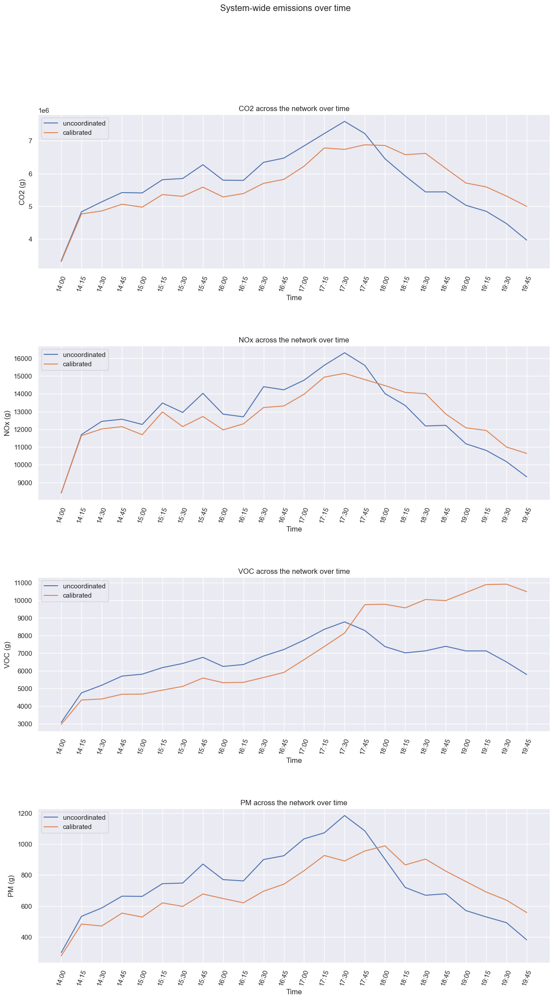

In [93]:
fig, axs = plt.subplots(4, figsize=(15, 25))
fig.suptitle('System-wide emissions over time')
for i in range(4):
    # for j in range(2):
    ax, metric = axs[i], emissions_columns[i][0]
    ax.plot(TIME_INTERVALS_STRING, emissions_df[f'{metric.name}_uncoordinated'], label='uncoordinated')
    ax.plot(TIME_INTERVALS_STRING, emissions_df[f'{metric.name}_calibrated'], label='calibrated')
    ax.set_title(f'{metric.name} across the network over time')
    ax.set_xlabel('Time')
    ax.set_ylabel(f'{metric.name} ({metric.unit})')
    ax.legend(loc="upper left")
    ax.tick_params('x', labelrotation=70) 

plt.subplots_adjust(wspace=0.3, hspace=0.5)
plt.show()

Text(0, 0.5, 'Emissions (g)')

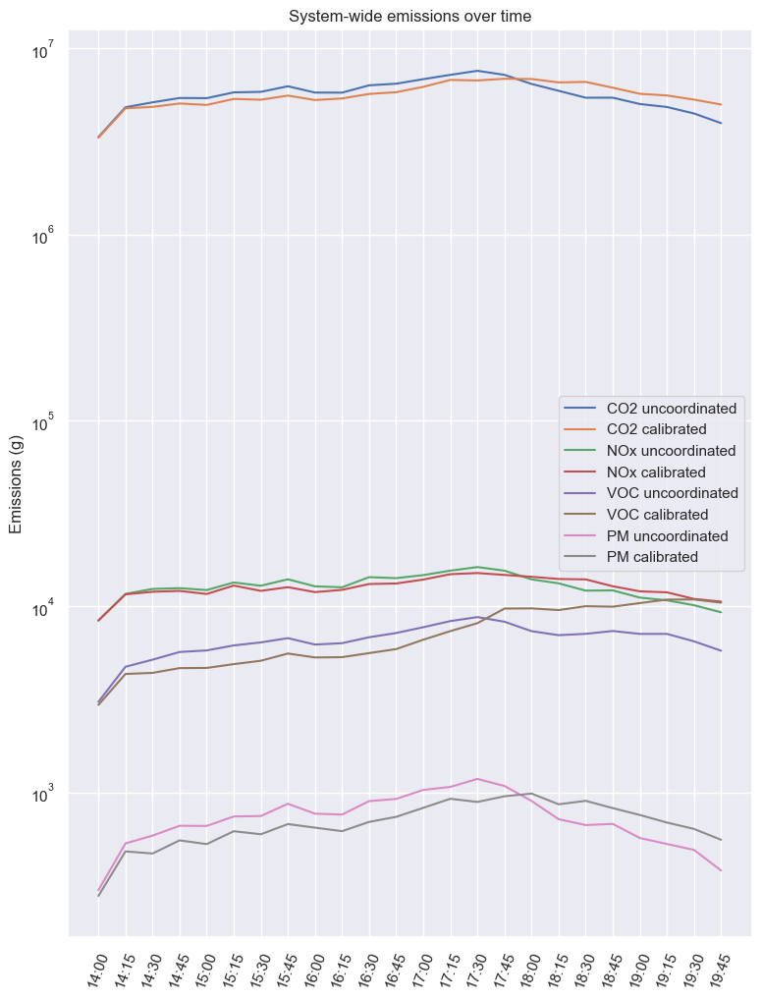

In [94]:
# dt = 0.01
# x = np.arange(-50.0, 50.0, dt)
# y = np.arange(0, 100.0, dt)
# # plt.subplot(312)
# plt.plot(y, x)
# plt.yscale('symlog')
# plt.ylabel('symlogy')



fig = plt.figure(figsize=(9, 12))
ax = plt.axes()
plt.title('System-wide emissions over time')

for i in range(4):
    metric = emissions_columns[i][0]
    ax.plot(TIME_INTERVALS_STRING, emissions_df[f'{metric.name}_uncoordinated'], label=f'{metric.name} uncoordinated')
    ax.plot(TIME_INTERVALS_STRING, emissions_df[f'{metric.name}_calibrated'], label=f'{metric.name} calibrated')

ax.tick_params('x', labelrotation=70)
plt.legend()
plt.yscale('symlog')
plt.ylabel('Emissions (g)')


# fig, axs = plt.subplots(4, figsize=(15, 25))
# fig.suptitle('System-wide emissions over time')
# for i in range(4):
#     # for j in range(2):
#     ax, metric = axs[i], emissions_columns[i][0]
#     ax.plot(TIME_INTERVALS_STRING, emissions_df[f'{metric.name}_uncoordinated'], label='uncoordinated')
#     ax.plot(TIME_INTERVALS_STRING, emissions_df[f'{metric.name}_calibrated'], label='calibrated')
#     ax.set_title(f'{metric.name} across the network over time')
#     ax.set_xlabel('Time')
#     ax.set_ylabel(f'{metric.name} ({metric.unit})')
#     ax.legend(loc="upper left")
#     ax.tick_params('x', labelrotation=70) 

# plt.subplots_adjust(wspace=0.3, hspace=0.5)
# plt.show()

# HCM Trajectory Analysis

* Longitudinal analysis computes for each vehicle in a link during each time step measures, cumulating them for all the time steps required to traverse the link, and then aggregating for all the vehicles that exit from the link during a statistics interval
* Spatial analysis computes for each link and for each lane during each time step measures that involve all the vehicles present, and then aggregating for all the time steps during a statistics interval

In [95]:
uncoordinated_hcm_query = pd.read_sql('SELECT * FROM HCMMIAPPROACH', uncoordinated_con)
uncoordinated_hcm_df = pd.DataFrame(uncoordinated_hcm_query)

uncoordinated_hcm_df.head()

,did,oid,eid,sid,ent,density,density_D,los,los_D,queue_delay,...,queued_vehicles,queued_vehicles_D,segment_delay,segment_delay_D,stopped_delay,stopped_delay_D,nbstops,nbstops_D,slow_vehicles,slow_vehicles_D
0,151642198,248,248,0,1,0.780573,-1.0,1.0,-1.0,6.020650,...,1.822222,-1.0,7.703775,3.238408,4.556952,1.385575,0.647367,0.304713,1.0,-1.0
1,151642198,257,257,0,1,32.908216,-1.0,3.0,-1.0,20.352714,...,50.525714,-1.0,21.946461,14.480430,18.148699,14.096548,0.186316,0.123443,53.0,-1.0
2,151642198,761,761,0,1,0.000000,-1.0,1.0,-1.0,-1.000000,...,0.000000,-1.0,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,0.0,-1.0
3,151642198,302,302,0,1,0.000000,-1.0,1.0,-1.0,-1.000000,...,0.000000,-1.0,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,0.0,-1.0
4,151642198,757,757,0,1,0.000000,-1.0,1.0,-1.0,-1.000000,...,0.000000,-1.0,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,0.0,-1.0


In [96]:
calibrated_hcm_query = pd.read_sql('SELECT * FROM HCMMIAPPROACH', calibrated_con)
calibrated_hcm_df = pd.DataFrame(calibrated_hcm_query)

calibrated_hcm_df.head()

,did,oid,eid,sid,ent,density,density_D,los,los_D,queue_delay,...,queued_vehicles,queued_vehicles_D,segment_delay,segment_delay_D,stopped_delay,stopped_delay_D,nbstops,nbstops_D,slow_vehicles,slow_vehicles_D
0,151642198,248,248,0,1,0.000000,-1.0,1.0,-1.0,-1.00000,...,0.000000,-1.0,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,0.0,-1.0
1,151642198,257,257,0,1,33.050236,-1.0,2.0,-1.0,18.39801,...,46.649841,-1.0,19.744219,14.222321,16.312359,13.524148,0.168761,0.120598,48.0,-1.0
2,151642198,761,761,0,1,0.000000,-1.0,1.0,-1.0,-1.00000,...,0.000000,-1.0,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,0.0,-1.0
3,151642198,302,302,0,1,0.000000,-1.0,1.0,-1.0,-1.00000,...,0.000000,-1.0,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,0.0,-1.0
4,151642198,757,757,0,1,0.000000,-1.0,1.0,-1.0,-1.00000,...,0.000000,-1.0,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,0.0,-1.0


In [97]:
dfs_hcm = {'uncoordinated': uncoordinated_hcm_df, 'calibrated': calibrated_hcm_df}
hcm_columns = {
    'density': Column('density', 'Density of vehicles', 'PCU/km'),
    'los': Column('los', 'Level of service', None),
    'queue_delay': Column('queue_delay', 'Queue delay', 's/veh'),
    'queue_length': Column('queue_length', 'Average queue length', 'veh'),
    'queued_vehicles': Column('queued_vehicles', 'Percent queued vehicles', '%'),
    'segment_delay': Column('segment_delay', 'Segment delay', 's/veh'),
    'stopped_delay': Column('stopped_delay', 'Stopped delay', 's/veh'),
    'nbstops': Column('nbstops', 'Number of stops', None),
    'slow_vehicles': Column('slow_vehicles', 'Percent slow vehicles', '%')
}
hcm_column_names = list(hcm_columns.keys())
group_cols = ['ent', 'eid']

def preprocess_hcm(df):
    for k in hcm_column_names:
        df[k] = df[k].astype(float)
    df['density'] = df['density'] * 0.621      # converting to km
    df['los'] = df['los'].astype(int)
    df = df[hcm_column_names + group_cols]
    return df[df['ent']!=0]

for k, df in dfs_hcm.items():
    dfs_hcm[k] = preprocess_hcm(df)

dfs_hcm['uncoordinated']

,density,los,queue_delay,queue_length,queued_vehicles,segment_delay,stopped_delay,nbstops,slow_vehicles,ent,eid
0,0.484736,1,6.020650,0.023111,1.822222,7.703775,4.556952,0.647367,1.0,1,248
1,20.436002,3,20.352714,1.275556,50.525714,21.946461,18.148699,0.186316,53.0,1,257
2,0.000000,1,-1.000000,0.000000,0.000000,-1.000000,-1.000000,-1.000000,0.0,1,761
3,0.000000,1,-1.000000,0.000000,0.000000,-1.000000,-1.000000,-1.000000,0.0,1,302
4,0.000000,1,-1.000000,0.000000,0.000000,-1.000000,-1.000000,-1.000000,0.0,1,757
...,...,...,...,...,...,...,...,...,...,...,...
13411,36.661508,4,54.143147,6.624889,75.398818,56.364769,51.262892,0.608747,74.0,24,56150
13412,77.548644,5,65.907973,3.723556,84.882565,66.929549,63.708786,0.165673,84.0,24,56433
13413,0.000000,1,-1.000000,0.000000,0.000000,-1.000000,-1.000000,-1.000000,0.0,24,56544
13414,0.000000,1,-1.000000,0.000000,0.000000,-1.000000,-1.000000,-1.000000,0.0,24,62332


In [98]:
dfs_hcm['calibrated']

,density,los,queue_delay,queue_length,queued_vehicles,segment_delay,stopped_delay,nbstops,slow_vehicles,ent,eid
0,0.000000,1,-1.000000,0.000000,0.000000,-1.000000,-1.000000,-1.000000,0.0,1,248
1,20.524197,2,18.398010,1.280889,46.649841,19.744219,16.312359,0.168761,48.0,1,257
2,0.000000,1,-1.000000,0.000000,0.000000,-1.000000,-1.000000,-1.000000,0.0,1,761
3,0.000000,1,-1.000000,0.000000,0.000000,-1.000000,-1.000000,-1.000000,0.0,1,302
4,0.000000,1,-1.000000,0.000000,0.000000,-1.000000,-1.000000,-1.000000,0.0,1,757
...,...,...,...,...,...,...,...,...,...,...,...
13411,68.018638,4,41.925028,10.191111,81.487678,44.385178,38.614088,0.551772,81.0,24,56150
13412,71.381526,5,58.655429,3.416889,86.164890,59.665087,56.363984,0.196523,85.0,24,56433
13413,0.000000,1,-1.000000,0.000000,0.000000,-1.000000,-1.000000,-1.000000,0.0,24,56544
13414,0.000000,1,-1.000000,0.000000,0.000000,-1.000000,-1.000000,-1.000000,0.0,24,62332


Not sure why this has more rows than the originals

In [99]:
hcm_df = dfs_hcm['uncoordinated'].merge(dfs_hcm['calibrated'], on=group_cols, how='left', suffixes=['_uncoordinated', '_calibrated']).dropna()
hcm_df

,density_uncoordinated,los_uncoordinated,queue_delay_uncoordinated,queue_length_uncoordinated,queued_vehicles_uncoordinated,segment_delay_uncoordinated,stopped_delay_uncoordinated,nbstops_uncoordinated,slow_vehicles_uncoordinated,ent,eid,density_calibrated,los_calibrated,queue_delay_calibrated,queue_length_calibrated,queued_vehicles_calibrated,segment_delay_calibrated,stopped_delay_calibrated,nbstops_calibrated,slow_vehicles_calibrated
0,0.484736,1,6.020650,0.023111,1.822222,7.703775,4.556952,0.647367,1.0,1,248,0.000000,1,-1.000000,0.000000,0.000000,-1.000000,-1.000000,-1.000000,0.0
1,20.436002,3,20.352714,1.275556,50.525714,21.946461,18.148699,0.186316,53.0,1,257,20.524197,2,18.398010,1.280889,46.649841,19.744219,16.312359,0.168761,48.0
2,0.000000,1,-1.000000,0.000000,0.000000,-1.000000,-1.000000,-1.000000,0.0,1,761,0.000000,1,-1.000000,0.000000,0.000000,-1.000000,-1.000000,-1.000000,0.0
3,0.000000,1,-1.000000,0.000000,0.000000,-1.000000,-1.000000,-1.000000,0.0,1,302,0.000000,1,-1.000000,0.000000,0.000000,-1.000000,-1.000000,-1.000000,0.0
4,0.000000,1,-1.000000,0.000000,0.000000,-1.000000,-1.000000,-1.000000,0.0,1,757,0.000000,1,-1.000000,0.000000,0.000000,-1.000000,-1.000000,-1.000000,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13459,36.661508,4,54.143147,6.624889,75.398818,56.364769,51.262892,0.608747,74.0,24,56150,68.018638,4,41.925028,10.191111,81.487678,44.385178,38.614088,0.551772,81.0
13460,77.548644,5,65.907973,3.723556,84.882565,66.929549,63.708786,0.165673,84.0,24,56433,71.381526,5,58.655429,3.416889,86.164890,59.665087,56.363984,0.196523,85.0
13461,0.000000,1,-1.000000,0.000000,0.000000,-1.000000,-1.000000,-1.000000,0.0,24,56544,0.000000,1,-1.000000,0.000000,0.000000,-1.000000,-1.000000,-1.000000,0.0
13462,0.000000,1,-1.000000,0.000000,0.000000,-1.000000,-1.000000,-1.000000,0.0,24,62332,0.000000,1,-1.000000,0.000000,0.000000,-1.000000,-1.000000,-1.000000,0.0


In [100]:
hcm_compare_cols = np.reshape(hcm_column_names.copy(), (3, 3))
hcm_compare_cols

array([['density', 'los', 'queue_delay'],
       ['queue_length', 'queued_vehicles', 'segment_delay'],
       ['stopped_delay', 'nbstops', 'slow_vehicles']], dtype='<U15')

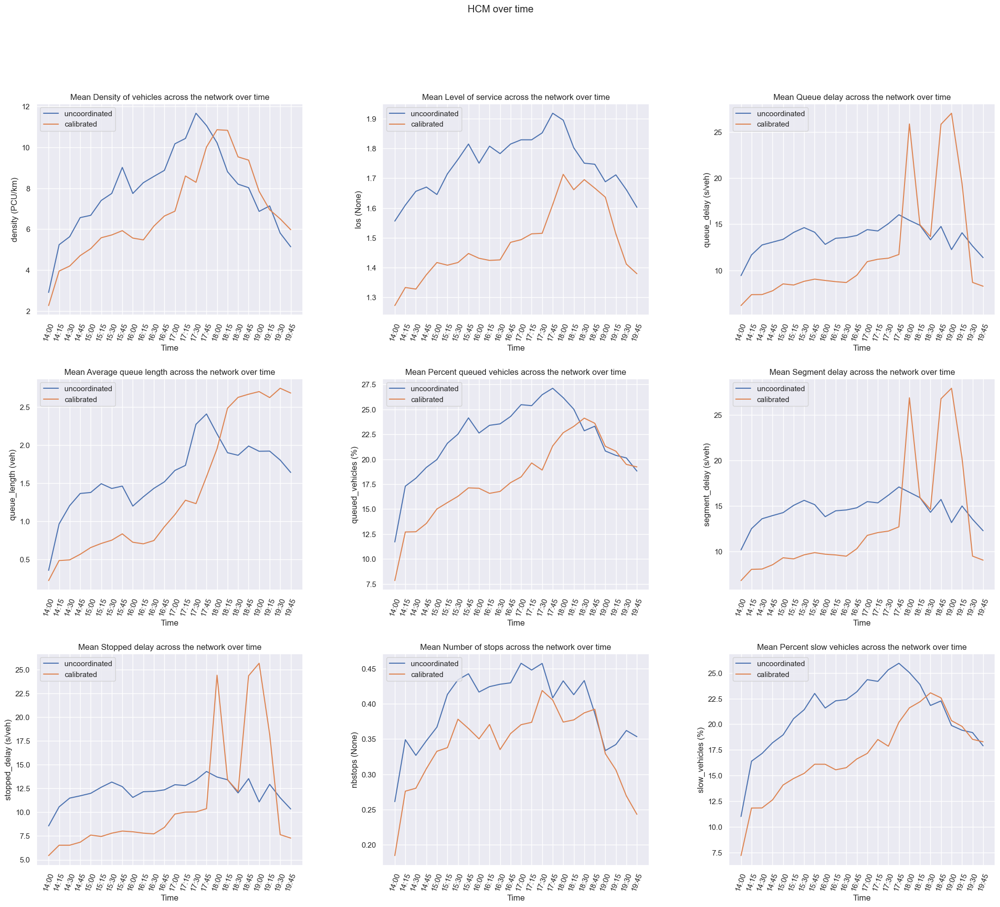

In [101]:
fig, axs = plt.subplots(3, 3, figsize=(25, 20))
fig.suptitle('HCM over time')
for i in range(3):
    for j in range(3):
        ax, metric = axs[i][j], hcm_columns[hcm_compare_cols[i][j]]
        # if metric.name == 'los':
        #     plt.hist([hcm_df[f'{metric.name}_uncoordinated'], hcm_df[f'{metric.name}_uncoordinated']], 
        #         label=['uncoordinated', 'calibrated'])
        #     ax.legend(loc="upper left")
        # else:
        metric_data = hcm_df[['ent', f'{metric.name}_uncoordinated', f'{metric.name}_calibrated']].groupby('ent').mean()
        ax.plot(TIME_INTERVALS_STRING, metric_data[f'{metric.name}_uncoordinated'], label='uncoordinated')
        ax.plot(TIME_INTERVALS_STRING, metric_data[f'{metric.name}_calibrated'], label='calibrated')
        ax.set_title(f'Mean {metric.desc} across the network over time')
        ax.set_xlabel('Time')
        ax.set_ylabel(f'{metric.name} ({metric.unit})')
        ax.legend(loc="upper left")
        ax.tick_params('x', labelrotation=70) 

plt.subplots_adjust(wspace=0.3, hspace=0.3)
plt.show()

# Patched sys/hcm graphs

In [106]:
sys_columns = {col.name: col for col in np.reshape(sys_columns, (8,))}
sys_columns

{'density': Column(density, Density, veh/km),
 'flow': Column(flow, Mean flow, veh/h),
 'ttime': Column(ttime, Mean travel time, s/km),
 'dtime': Column(dtime, Mean delay time, s/km),
 'speed': Column(speed, Mean speed, km/h),
 'qmean': Column(qmean, Mean vehicles in queue, veh),
 'fuelc': Column(fuelc, Total fuel consumed, L),
 'batteryc': Column(batteryc, Total battery consumed, kWh)}

In [103]:
hcm_columns

{'density': Column(density, Density of vehicles, PCU/km),
 'los': Column(los, Level of service, None),
 'queue_delay': Column(queue_delay, Queue delay, s/veh),
 'queue_length': Column(queue_length, Average queue length, veh),
 'queued_vehicles': Column(queued_vehicles, Percent queued vehicles, %),
 'segment_delay': Column(segment_delay, Segment delay, s/veh),
 'stopped_delay': Column(stopped_delay, Stopped delay, s/veh),
 'nbstops': Column(nbstops, Number of stops, None),
 'slow_vehicles': Column(slow_vehicles, Percent slow vehicles, %)}

In [140]:
hcm_df['los_uncoordinated'].unique()

array([1, 3, 2, 4, 5, 6])

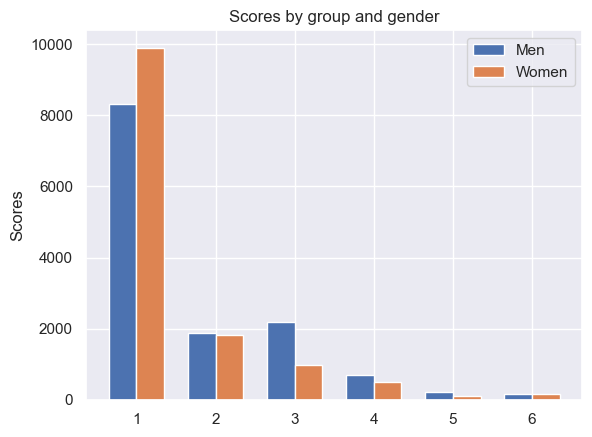

In [135]:
labels = [1,2,3,4,5,6]
men_means = hcm_df['los_uncoordinated'].value_counts().sort_index()
women_means = hcm_df['los_calibrated'].value_counts().sort_index()

x = np.arange(len(labels))  # the label locations
width = 0.35  # the width of the bars

fig, ax = plt.subplots()
rects1 = ax.bar(x - width/2, men_means, width, label='Men')
rects2 = ax.bar(x + width/2, women_means, width, label='Women')

ax.set_ylabel('Scores')
ax.set_title('Scores by group and gender')
ax.set_xticks(x, labels)
ax.legend()

plt.show()

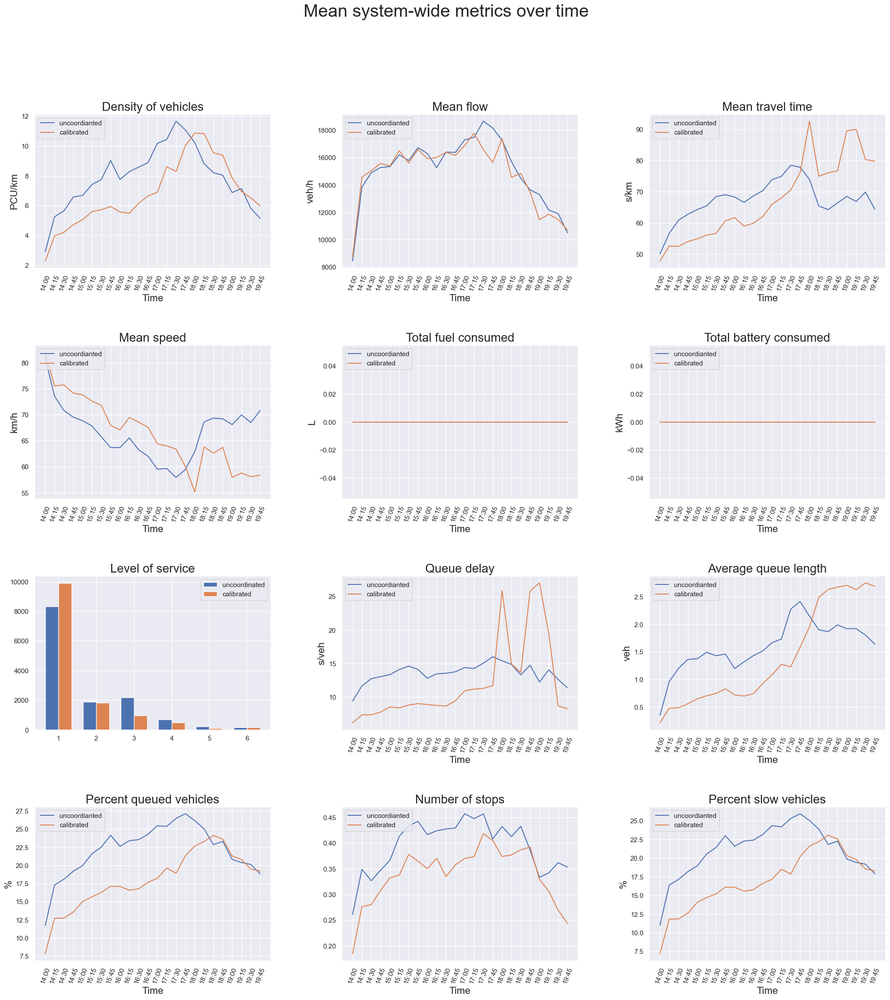

In [149]:
from matplotlib import rcParams as rc

def sys_line_plot(metric, data, ax):
    data_uncoordinated, data_calibrated = data
    ax.plot(TIME_INTERVALS_STRING, data_uncoordinated, label='uncoordianted')
    ax.plot(TIME_INTERVALS_STRING, data_calibrated, label='calibrated')
    ax.set_title(f'{metric.desc}', size=20)
    ax.set_xlabel('Time', size=16)
    ax.set_ylabel(metric.unit, size=16)
    ax.legend(loc='upper left')
    ax.tick_params('x', labelrotation=70)

def sys_bar_plot(metric, data, ax):
    data_uncoordinated, data_calibrated = data
    labels = sorted(data_uncoordinated.unique())
    width = 0.35
    rects_uncoordinated = ax.bar(
        np.arange(len(labels)) - width/2, data_uncoordinated.value_counts().sort_index(), width, label='uncoordinated')
    rects_calibrated = ax.bar(
        np.arange(len(labels)) + width/2, data_calibrated.value_counts().sort_index(), width, label='calibrated')
    ax.set_title(f'{metric.desc}', size=20)
    ax.set_ylabel(metric.unit, size=16)
    ax.legend(loc='upper right')
    ax.set_xticks(x, labels)


fig, axs = plt.subplots(4, 3, figsize=(25, 25))
fig.suptitle('Mean system-wide metrics over time')

sys_hcm_columns = [
    hcm_columns['density'],
    sys_columns['flow'],
    sys_columns['ttime'],
    sys_columns['speed'],
    sys_columns['fuelc'],
    sys_columns['batteryc'],
    hcm_columns['los'],
    hcm_columns['queue_delay'],
    hcm_columns['queue_length'],
    hcm_columns['queued_vehicles'],
    hcm_columns['nbstops'],
    hcm_columns['slow_vehicles']
]

sys_hcm_columns = np.reshape(sys_hcm_columns, (4, 3))

for i in range(4):
    for j in range(3):
        ax, metric = axs[i][j], sys_hcm_columns[i][j]
        if metric.name == 'los':
            data_uncoordinated = hcm_df[f'{metric.name}_uncoordinated']
            data_calibrated = hcm_df[f'{metric.name}_calibrated']
            sys_bar_plot(metric, (data_uncoordinated, data_calibrated), ax)
        elif metric.name in hcm_columns:
            data = hcm_df[['ent', f'{metric.name}_uncoordinated', \
                f'{metric.name}_calibrated']].groupby('ent').mean()
            data_uncoordinated = data[f'{metric.name}_uncoordinated']
            data_calibrated = data[f'{metric.name}_calibrated']
            sys_line_plot(metric, (data_uncoordinated, data_calibrated), ax)
        else:
            data_uncoordinated = sys_df[f'{metric.name}_uncoordinated']
            data_calibrated = sys_df[f'{metric.name}_calibrated']
            sys_line_plot(metric, (data_uncoordinated, data_calibrated), ax)

plt.subplots_adjust(wspace=0.3, hspace=0.5)
plt.savefig('C:\\Users\\prest\\Preston\\Berkeley\\fremont_project\\images\\sys_hcm.png',
    bbox_inches='tight', pad_inches=0)
plt.show()

# RGap

I'm not sure exactly how this works, but I'm assuming that data is collected every minute (due to 361 rows in 6 hours).

In [106]:
uncoordinated_rgap_query = pd.read_sql('SELECT * FROM RGap', uncoordinated_con)
uncoordinated_rgap_df = pd.DataFrame(uncoordinated_rgap_query)

uncoordinated_rgap_df.head()

,did,oid,eid,sid,ent,rgapInstantaneous,rgapInstantaneous_D,rgapExperienced,rgapExperienced_D
0,151642198,151642198,None,0,1,0.015156,-1.0,0.028925,-1.0
1,151642198,151642198,None,0,2,0.010300,-1.0,0.013293,-1.0
2,151642198,151642198,None,0,3,0.018570,-1.0,0.028244,-1.0
3,151642198,151642198,None,0,4,0.010625,-1.0,0.016442,-1.0
4,151642198,151642198,None,0,5,0.012213,-1.0,0.010976,-1.0


In [107]:
calibrated_rgap_query = pd.read_sql('SELECT * FROM RGap', calibrated_con)
calibrated_rgap_df = pd.DataFrame(calibrated_rgap_query)

calibrated_rgap_df.head()

,did,oid,eid,sid,ent,rgapInstantaneous,rgapInstantaneous_D,rgapExperienced,rgapExperienced_D
0,151642198,151642198,None,0,1,0.012938,-1.0,0.012101,-1.0
1,151642198,151642198,None,0,2,0.014063,-1.0,0.013460,-1.0
2,151642198,151642198,None,0,3,0.012677,-1.0,0.018196,-1.0
3,151642198,151642198,None,0,4,0.007353,-1.0,0.011982,-1.0
4,151642198,151642198,None,0,5,0.006526,-1.0,0.003027,-1.0


In [108]:
dfs_rgap= {'uncoordinated': uncoordinated_rgap_df, 'calibrated': calibrated_rgap_df}
rgap_columns = {
    'rgapInstantaneous': Column('rgapInstantaneous', 'Instantaneous relative gap', None),
    'rgapExperienced': Column('rgapExperienced', 'Experienced relative gap', None)
}

for k, df in dfs_rgap.items():
    df = df[df['ent']!=0]
    dfs_rgap[k] = df[rgap_columns.keys()]

rgap_df = dfs_rgap['uncoordinated'].join(dfs_rgap['calibrated'], lsuffix='_uncoordinated', rsuffix='_calibrated')
rgap_df

,rgapInstantaneous_uncoordinated,rgapExperienced_uncoordinated,rgapInstantaneous_calibrated,rgapExperienced_calibrated
0,0.015156,0.028925,0.012938,0.012101
1,0.010300,0.013293,0.014063,0.013460
2,0.018570,0.028244,0.012677,0.018196
3,0.010625,0.016442,0.007353,0.011982
4,0.012213,0.010976,0.006526,0.003027
...,...,...,...,...
355,0.040149,0.030278,0.364382,0.042293
356,0.098089,0.089092,0.056518,0.244671
357,0.354563,0.321103,0.095003,0.204594
358,0.090418,0.076703,0.115749,0.088554


In [109]:
metric_name, metric_units = 'Relative gap', 's'
uncoordinated_rgap = postprocessing_plot_util.process_network_delay_time_data(
    uncoordinated_simulation_results_database, TIME_INTERVALS)

calibrated_rgap = postprocessing_plot_util.process_network_delay_time_data(
    calibrated_simulation_results_database, TIME_INTERVALS)

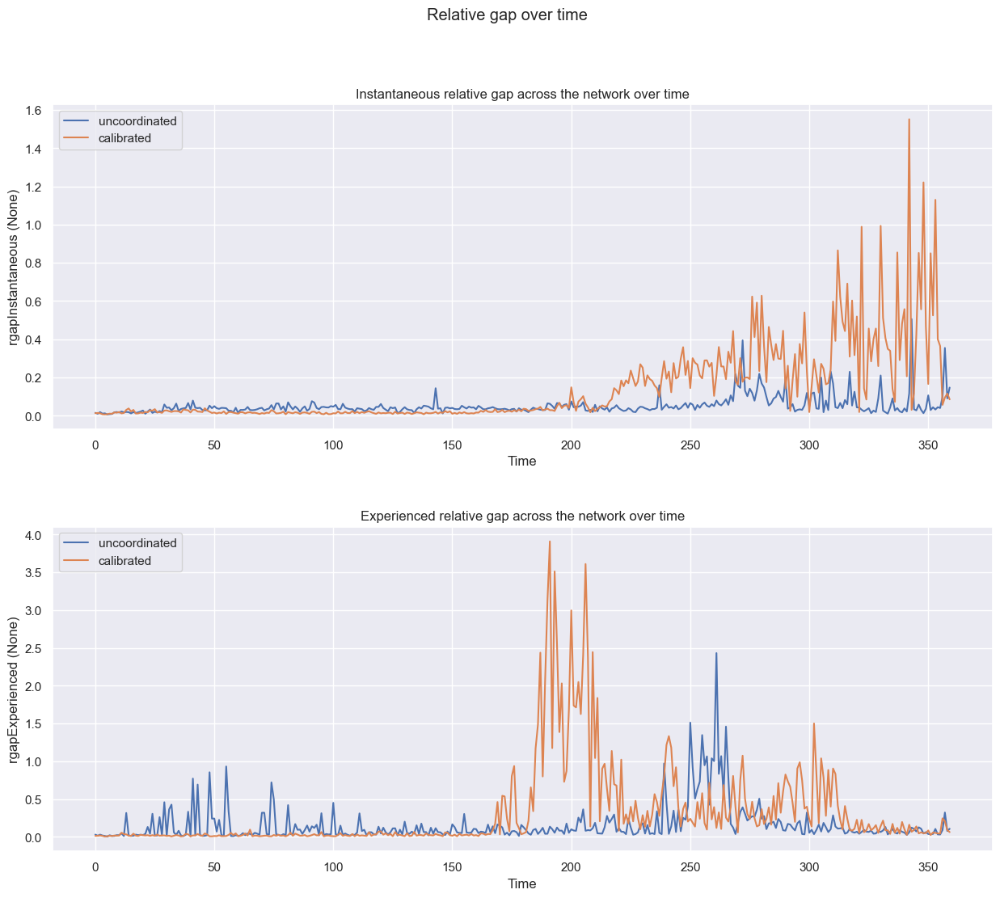

In [110]:
fig, axs = plt.subplots(2, figsize=(15, 12))
fig.suptitle('Relative gap over time')
for i in range(2):
    ax, metric = axs[i], rgap_columns[list(rgap_columns.keys())[i]]
    ax.plot(rgap_df[f'{metric.name}_uncoordinated'], label='uncoordinated')
    ax.plot(rgap_df[f'{metric.name}_calibrated'], label='calibrated')
    ax.set_title(f'{metric.desc} across the network over time')
    ax.set_xlabel('Time')
    ax.set_ylabel(f'{metric.name} ({metric.unit})')
    ax.legend(loc="upper left")
    # ax.tick_params('x', labelrotation=70) 

plt.subplots_adjust(wspace=0.3, hspace=0.3)
plt.show()


# plt.xlabel("Timestep")
# plt.ylabel(f"{metric_name} ({metric_units})")
# plt.plot(TIME_INTERVALS_STRING, uncoordinated_simulated_metric_values, label='uncoordinated')
# plt.plot(TIME_INTERVALS_STRING, calibrated_simulated_metric_values, label='calibrated')
# plt.legend(loc="upper left")
# plt.xticks(rotation=70)
# plt.show()